In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
# import tensorflow as tf
%reload_ext autoreload
from numpy import *
import random
from matplotlib.patches import Circle, Wedge, Polygon
from matplotlib.collections import PatchCollection
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.models import load_model
from scipy.interpolate import make_interp_spline, BSpline
from scipy.interpolate import interp1d
from matplotlib.ticker import MultipleLocator

2024-05-18 18:33:43.177395: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [107]:
target2 = np.ones(128)
target2[50:65] = 0.14

In [171]:
# fab1 = np.loadtxt('S11_sym.csv',delimiter=',')
fab2 =  np.loadtxt('sym_2.4_S11.csv',delimiter=',')
sim2 = np.loadtxt('2.4G_DNNpred.txt')
sim = np.loadtxt('sym_single_S11.txt')
np.shape(sim2)

(128, 2)

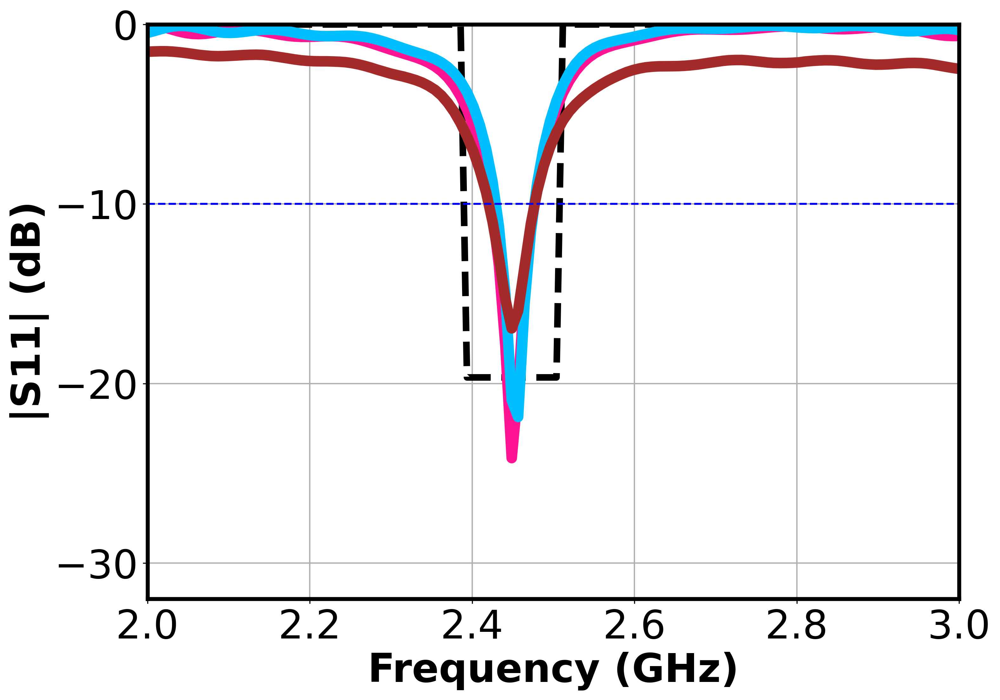

In [172]:
# fab_s11=fab1[:,0:2]
fab2_s11=fab2[:,0:2]
sim = sim[:,1]
sim2 = sim2[:,1]
freq = np.linspace(2,3,128)
plt.figure(figsize = (11, 8),dpi=300)
plt.plot(freq,10*np.log(target2),label='target',linewidth=5,color = 'black',ls='--')
plt.plot(freq,sim2,label='DNN_predicted',linewidth=8,color = 'deeppink')
plt.plot(freq,sim,label='sim_ant',linewidth=8,color = 'deepskyblue')
plt.plot(freq,fab2_s11[:,1],label='fabricated_ant',linewidth=8,color = 'brown')
plt.axhline(y=-10, color='b', linestyle='--')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
ax = plt.gca()
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_linewidth(3)
ax.yaxis.set_major_locator(MultipleLocator(10))
plt.xlabel('Frequency (GHz)',fontsize=30,fontweight='bold', color='black')
plt.ylabel('|S11| (dB)',fontsize=30,fontweight='bold', color='black')
# plt.legend(fontsize=20)
# plt.title('Sym_patch_2.45GHz',fontsize=30)
plt.xlim(2,3)
plt.ylim(-32,0)
plt.grid(True, which='both', linewidth=1)
# plt.savefig('sym.png')
plt.show()

In [311]:
fab2 = np.loadtxt('dual_S11.csv',delimiter=',')
# fabn = np.loadtxt('dualn_S11.csv',delimiter=',')
sim = np.loadtxt('Sym_dual_S11.txt')
sim2 = np.loadtxt('dual_dnnpred_S11.txt')
# sim3 = np.loadtxt('ant128S11_dual.txt',delimiter=',')
np.shape(fabn)

(128, 3)

In [312]:
target3 = np.ones(128)
target3[13:28] = 0.14
target3[102:117] = 0.14

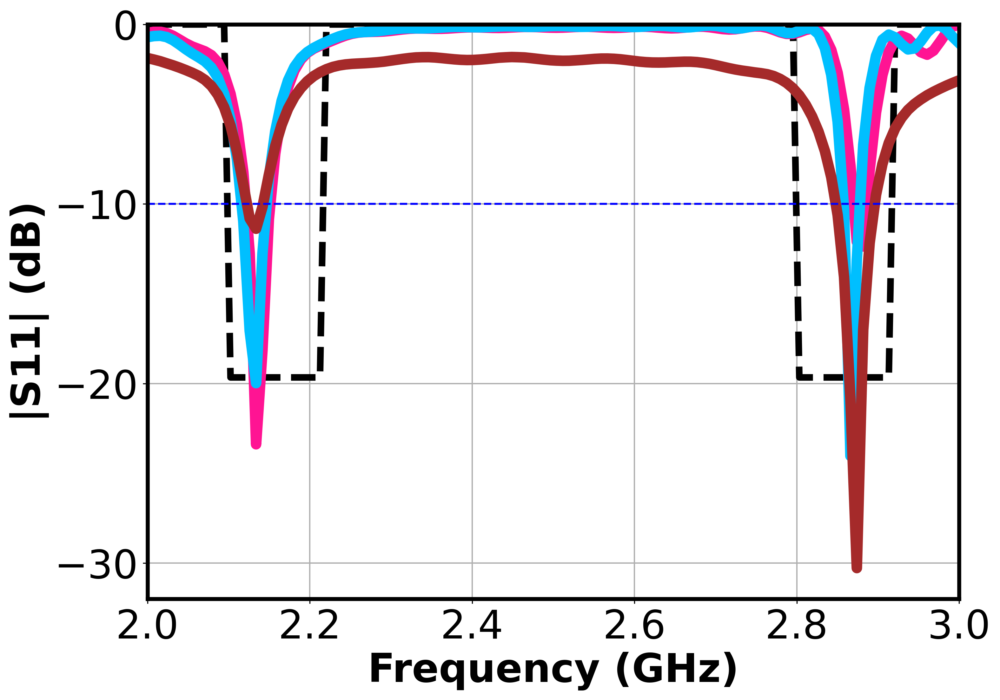

In [313]:
fab_s11=fab2[:,0:2]
fabn_s11=fabn[:,0:2]
sim = sim[:,1]
sim2 = sim2[:,1]
freq = np.linspace(2,3,128)
plt.figure(figsize = (11, 8),dpi=300)
plt.plot(freq,10*np.log(target3),label='target',linewidth=5,color = 'black',ls='--')
plt.plot(freq,sim2,label='DNN_predicted',linewidth=8,color = 'deeppink')
plt.plot(freq,sim,label='sim_ant',linewidth=8,color = 'deepskyblue')
plt.plot(freq,fab_s11[:,1],label='fabricated_ant',linewidth=8,color = 'brown')

plt.axhline(y=-10, color='b', linestyle='--')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
ax = plt.gca()
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_linewidth(3)
ax.yaxis.set_major_locator(MultipleLocator(10))
plt.xlabel('Frequency (GHz)',fontsize=30,fontweight='bold', color='black')
plt.ylabel('|S11| (dB)',fontsize=30,fontweight='bold', color='black')
# plt.legend(fontsize=20)
# plt.title('Dual-band_patch',fontsize=30)
plt.xlim(2,3)
plt.ylim(-32,0)
plt.grid(True, which='both', linewidth=1)
# plt.savefig('dual S11.png')
plt.show()


In [628]:
fabwb = np.loadtxt('WB_S11.csv',delimiter=',')
np.shape(fabwb)
simwb = np.loadtxt('antWB_DNN_pred.txt',delimiter=',')
simwB = np.loadtxt('WB_DNN_predicted.txt')
simwx = np.loadtxt('WB_S1.txt')

In [716]:
target5 = np.ones(128)
target5[68:103] = 0.14

(138,)


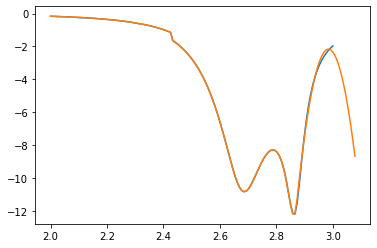

In [709]:
xx = simwb
xx1=np.concatenate((xx[:-17], y_pred))
print(np.shape(xx1))
freq = np.linspace(2,3,128)
freq2 = np.linspace(2, 3.078125, 138)

plt.plot(freq, xx)
plt.plot(freq2, xx1)

[2.87401575 2.88188976 2.88976378 2.8976378  2.90551181 2.91338583
 2.92125984 2.92913386 2.93700787 2.94488189 2.95275591 2.96062992
 2.96850394 2.97637795 2.98425197 2.99212598 3.        ]


/tmp/ipykernel_19592/4053830692.py:16: DeprecationWarning: scipy.polyfit is deprecated and will be removed in SciPy 2.0.0, use numpy.polyfit instead
  a, b, c = polyfit(x, y, 2)
/tmp/ipykernel_19592/4053830692.py:17: DeprecationWarning: scipy.polyval is deprecated and will be removed in SciPy 2.0.0, use numpy.polyval instead
  y_pred = polyval([a, b, c], x)    # y_pred refers to predicted values of y
/tmp/ipykernel_19592/4053830692.py:28: DeprecationWarning: scipy.polyval is deprecated and will be removed in SciPy 2.0.0, use numpy.polyval instead
  y_pred = polyval([a, b, c], x_out)


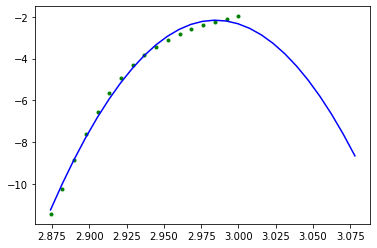

In [703]:
import numpy as np
from scipy import polyval, polyfit
from matplotlib import pyplot as plt

n=10   # 10 data points
# make up some data
x = np.linspace(2, 3, 128)
x = x[-17:]
print(x)
y = simwb
y = y[-17:]
# add some noise 

# the shape of the data suggests a 2d polynomial, so begin there
# a, b, c are the polynomial coefficients: ax^2 + bx + c
a, b, c = polyfit(x, y, 2)
y_pred = polyval([a, b, c], x)    # y_pred refers to predicted values of y

# how good is the fit?
# calculate MSE:
MSE = NP.sqrt( NP.sum((y_pred-y)**2)/10 )
# MSE = .2

# now use the model polynomial to generate y values based on x values outside 
# the range of the original data:
x_out = np.linspace(2.87401575, 3.078125, 27)   # choose 20 points, 10 in, 10 outside original range

y_pred = polyval([a, b, c], x_out)

# now plot the original data points and the polynomial fit through them
fig = plt.figure()
ax1 = fig.add_subplot(111)

ax1.plot(x, y, 'g.', x_out, y_pred, 'b-')

plt.show()

In [705]:
y_pred

array([-11.25174911, -10.00647832,  -8.8528626 ,  -7.79090197,
        -6.82059642,  -5.94194596,  -5.15495057,  -4.45961027,
        -3.85592504,  -3.3438949 ,  -2.92351984,  -2.59479987,
        -2.35773497,  -2.21232516,  -2.15857043,  -2.19647078,
        -2.32602621,  -2.54723672,  -2.86010232,  -3.264623  ,
        -3.76079876,  -4.3486296 ,  -5.02811552,  -5.79925652,
        -6.66205261,  -7.61650378,  -8.66261003])

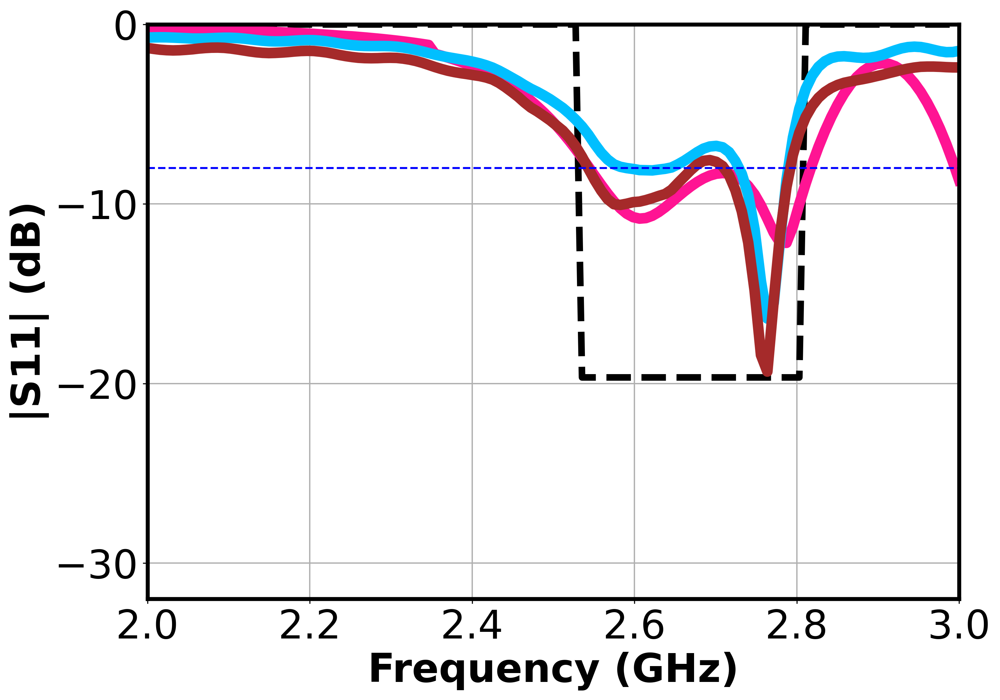

In [717]:
fab_s11=fabwb[:,0:2]
freq = np.linspace(2,3,128)
plt.figure(figsize = (11, 8),dpi=300)
plt.plot(freq,10*np.log(target5),label='target_S11',linewidth=5,color = 'black',ls='--')
plt.plot(freq,xx1[10:],label='DNN_predicted',linewidth=8,color = 'deeppink')
plt.plot(freq,(simwx[:,1]+fab_s11[:,1])/2,label='EM_simulated',linewidth=8,color = 'deepskyblue')
# plt.plot(freq,simwB,linewidth=5,color = 'green')
plt.plot(freq,fab_s11[:,1],label='fabricated_ant_S11',linewidth=8,color = 'brown')
plt.axhline(y=-8, color='b', linestyle='--')

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
ax = plt.gca()
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_linewidth(3)
ax.yaxis.set_major_locator(MultipleLocator(10))
plt.xlabel('Frequency (GHz)',fontsize=30,fontweight='bold', color='black')
plt.ylabel('|S11| (dB)',fontsize=30,fontweight='bold', color='black')
plt.xlim(2,3)
plt.ylim(-32,0)
# plt.title('wide-band_patch',fontsize=30)
# plt.legend(fontsize=20)
plt.grid(True, which='both', linewidth=1)
# plt.savefig('WB_S11.png')
plt.show()

In [8]:
fab5 = np.loadtxt('WB_1_6_S11.csv',delimiter=',')
np.shape(fab5)
sim5 = np.loadtxt('RFEH_WB_CST_S11.txt')
sim5 = sim5[:,1]
np.shape(sim5)

(128,)

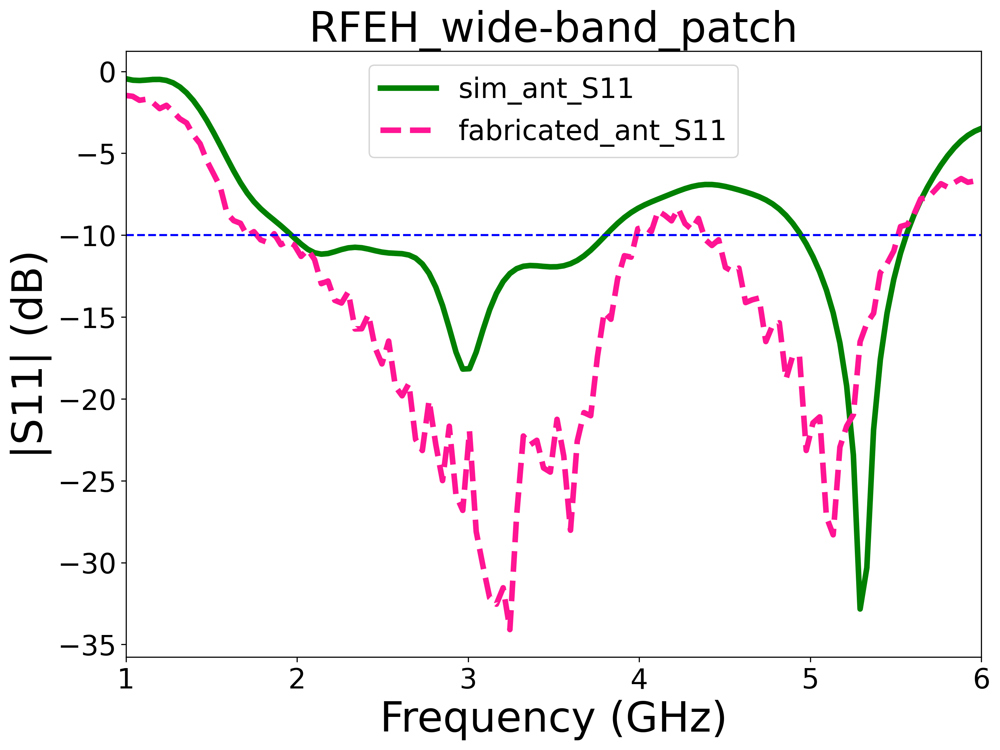

In [9]:
fab_s11=fab5[:,0:2]
# 
freq = np.linspace(1,6,128)
plt.figure(figsize = (11, 8),dpi=300)
plt.plot(freq,sim5,label='sim_ant_S11',linewidth=4,color = 'green')
plt.plot(freq,fab_s11[:,1],label='fabricated_ant_S11',linewidth=4,color = 'deeppink',ls = '--')
plt.axhline(y=-10, color='b', linestyle='--')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim(1,6)
# plt.ylim(-21,0)
plt.xlabel('Frequency (GHz)',fontsize=30)
plt.ylabel('|S11| (dB)',fontsize=30)
plt.title('RFEH_wide-band_patch',fontsize=30)
plt.legend(fontsize=20)
plt.show()

In [10]:
fab6 = np.loadtxt('rect_S11.csv',delimiter=',')
np.shape(fab5)
sim6 = np.loadtxt('Rect_CST_S11.txt')
sim6 = sim6[:,1]
np.shape(sim6)

(128,)

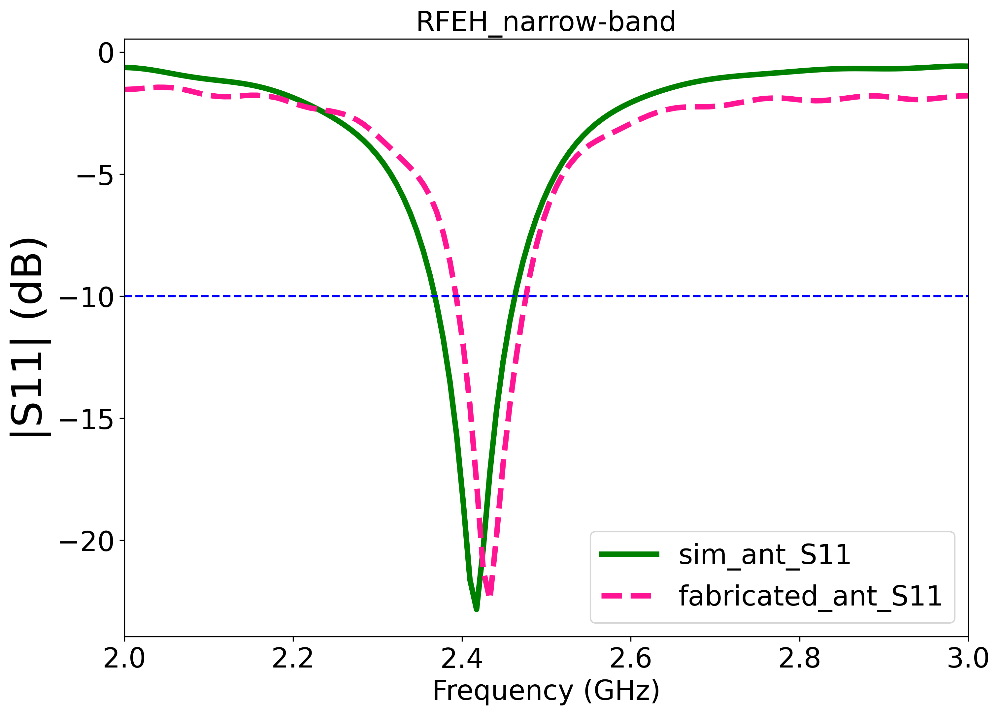

In [11]:
fab_s11=fab6[:,0:2]

freq = np.linspace(2,3,128)
plt.figure(figsize = (11, 8),dpi=300)
plt.plot(freq,sim6,label='sim_ant_S11',linewidth=4,color = 'green')
plt.plot(freq,fab_s11[:,1],label='fabricated_ant_S11',linewidth=4,color = 'deeppink',ls = '--')
plt.axhline(y=-10, color='b', linestyle='--')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim(2,3)
# plt.ylim(-21,0)
plt.xlabel('Frequency (GHz)',fontsize=20)
plt.ylabel('|S11| (dB)',fontsize=30)
plt.title('RFEH_narrow-band',fontsize=20)
plt.legend(fontsize=20)
plt.show()

In [12]:
fab6 = np.loadtxt('rect_S11.csv',delimiter=',')
np.shape(fab5)
sim6 = np.loadtxt('Rect_CST_S11.txt')
sim6 = sim6[:,1]
np.shape(sim6)

(201, 8)

# Gain Plots

In [14]:
gain_single = np.loadtxt('Gain_calc_single.csv',delimiter=',')
gain_dual = np.loadtxt('Gain_calc_dual.csv',delimiter=',')
gain_WB = np.loadtxt('Gain_calc_WB2.csv',delimiter=',')
gain_single.shape

(12, 9)

In [397]:
freq = np.linspace(2, 3, 12)
freq2 = np.linspace(2, 3, 128)
interp_func1 = interp1d(freq, gain_single, kind='cubic', axis=0)
gain_smooth = interp_func1(freq2)
gain_smooth.shape

(128, 9)

(2.0, 3.0)

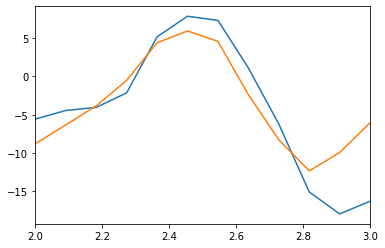

In [217]:
plt.plot(freq, gain_single[:,7])
plt.plot(freq, gain_single[:,8])
plt.xlim(2, 3)

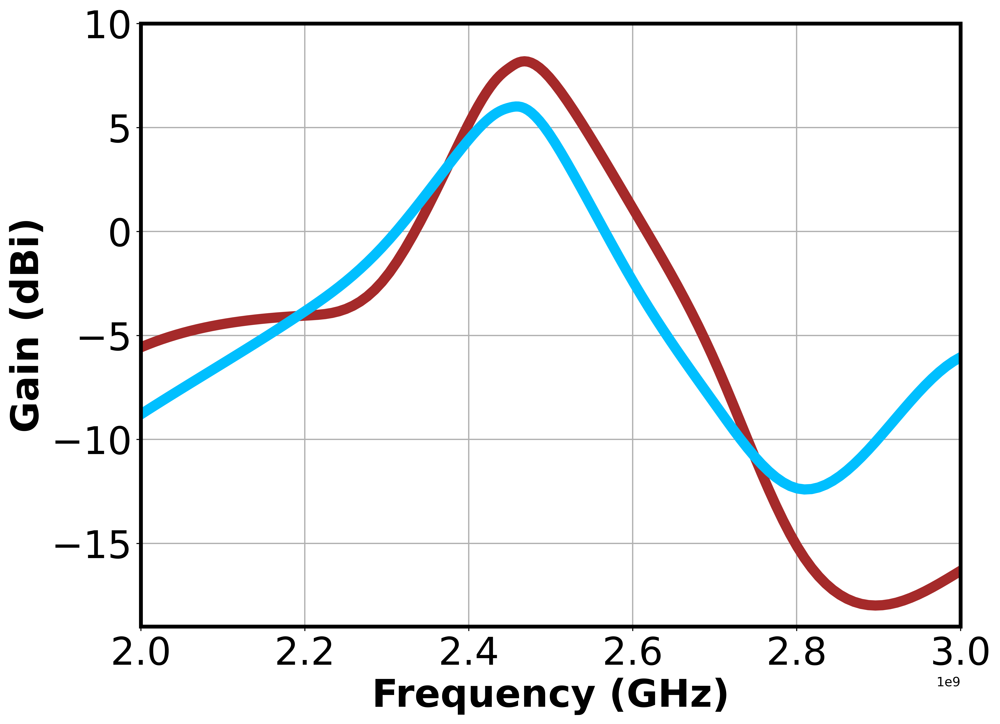

In [399]:
# Define the data
freq = gain_smooth[:,0]
gain_fabricated = gain_smooth[:,7]
gain_simulated = gain_smooth[:,8]

# Create the plot
plt.figure(figsize=(11, 8), dpi=600)

# Plot fabricated gain
plt.plot(freq, gain_fabricated, label='Gain_fabricated', linewidth=8, color='brown')
# plt.scatter(freq, gain_fabricated, linewidth=8, color='brown')

# Plot simulated gain
plt.plot(freq, gain_simulated, label='Gain_simulated', linewidth=8, color='deepskyblue')
# plt.scatter(freq, gain_simulated, linewidth=8, color='deepskyblue')

# # Fill the region of interest
# plt.fill_betweenx(y=[-20, 10],
#                   x1=2.39e9, x2=2.52e9, color='lightgrey', alpha=0.5, label='Region of Interest')

# Customize plot aesthetics
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
ax = plt.gca()
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_linewidth(3)
plt.xlabel('Frequency (GHz)', fontsize=30, fontweight='bold', color='black')
plt.ylabel('Gain (dBi)', fontsize=30, fontweight='bold', color='black')
plt.xlim(2e9, 3e9)
plt.ylim(-19, 10)
plt.grid(True, which='both', linewidth=1)
# plt.legend(fontsize=20)
plt.tight_layout()
plt.show()


In [400]:
freq = np.linspace(2, 3, 12)
freq2 = np.linspace(2, 3, 128)
interp_func1 = interp1d(freq, gain_dual, kind='cubic', axis=0)
gain_smooth = interp_func1(freq2)
gain_smooth.shape

(128, 9)

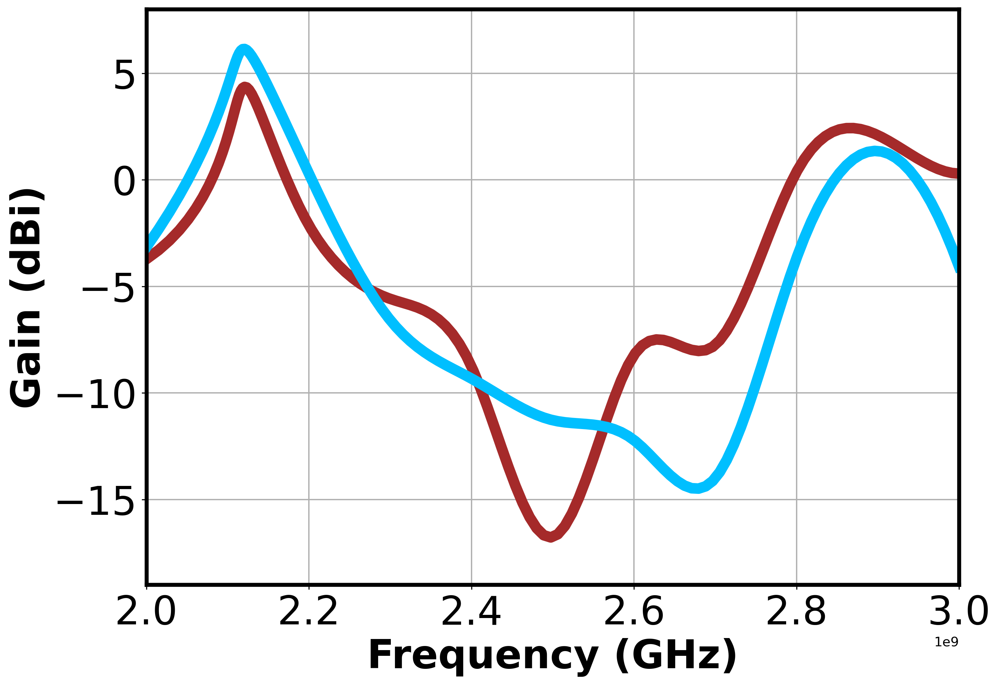

In [401]:
# Define the data
freq = gain_smooth[:,0]
gain_fabricated = gain_smooth[:,7]
gain_simulated = gain_smooth[:,8]

# Create the plot
plt.figure(figsize=(11, 8), dpi=300)

# Plot fabricated gain
plt.plot(freq, gain_fabricated, label='Gain_fabricated', linewidth=8, color='brown')
# plt.scatter(freq, gain_fabricated, linewidth=8, color='brown')

# Plot simulated gain
plt.plot(freq, gain_simulated, label='Gain_simulated', linewidth=8, color='deepskyblue')
# plt.scatter(freq, gain_simulated, linewidth=8, color='deepskyblue')
# Fill the region of interest
# plt.fill_betweenx(y=[-20, 10],
#                   x1=2.1e9, x2=2.21e9, color='lightgrey', alpha=0.5, label='Region of Interest')
# plt.fill_betweenx(y=[-20, 10],
#                   x1=2.79e9, x2=2.91e9, color='lightgrey', alpha=0.5, label='Region of Interest')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
ax = plt.gca()
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_linewidth(3)
# ax.yaxis.set_major_locator(MultipleLocator(10))
plt.xlabel('Frequency (GHz)',fontsize=30,fontweight='bold', color='black')
plt.ylabel('Gain (dBi)',fontsize=30,fontweight='bold', color='black')
# plt.legend(fontsize=20)
# plt.title('Sym_patch_2.45GHz',fontsize=30)
plt.xlim(2e9,3e9)
plt.ylim(-19, 8)
plt.grid(True, which='both', linewidth=1)
plt.show()

In [15]:
freq = np.linspace(2, 3, 12)
freq2 = np.linspace(2, 3, 128)
interp_func1 = interp1d(freq, gain_WB, kind='cubic', axis=0)
gain_smooth = interp_func1(freq2)
gain_smooth.shape

(128, 9)

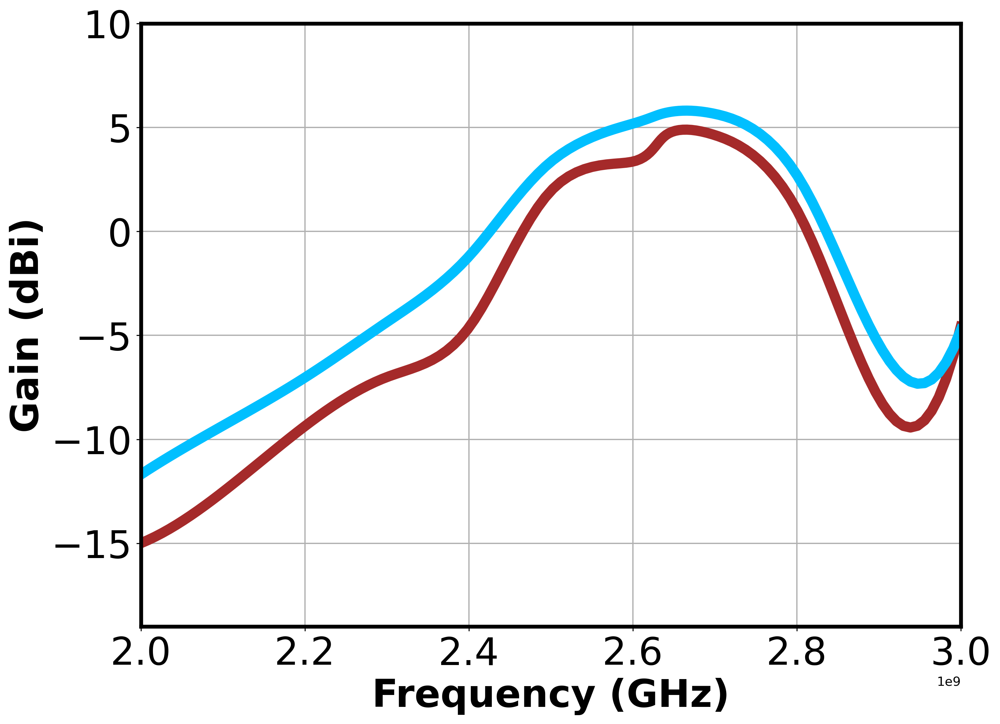

In [16]:
# Define the data
freq = gain_smooth[:,0]
gain_fabricated = gain_smooth[:,7]
gain_simulated = gain_smooth[:,8]

# Create the plot
plt.figure(figsize=(11, 8), dpi=300)

# Plot fabricated gain
plt.plot(freq, gain_fabricated, label='Gain_fabricated', linewidth=8, color='brown')
# plt.scatter(freq, gain_fabricated, linewidth=8, color='brown')

# Plot simulated gain
plt.plot(freq, gain_simulated, label='Gain_simulated', linewidth=8, color='deepskyblue')
# plt.scatter(freq, gain_simulated, linewidth=8, color='deepskyblue')

# plt.fill_betweenx(y=[-20, 10],
#                   x1=2.60e9, x2=2.82e9, color='lightgrey', alpha=0.5, label='Region of Interest')
# # Customize plot aesthetics
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
ax = plt.gca()
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_linewidth(3)
plt.xlabel('Frequency (GHz)', fontsize=30, fontweight='bold', color='black')
plt.ylabel('Gain (dBi)', fontsize=30, fontweight='bold', color='black')
plt.xlim(2e9, 3e9)
plt.ylim(-19, 10)
plt.grid(True, which='both', linewidth=1)
# plt.legend(fontsize=20)
plt.tight_layout()
plt.show()


In [125]:
rect_ant_10deg = np.genfromtxt('Rectangular 2.4_11-03-24_L_10 degree.csv',dtype=None, delimiter='\t')
rect_ant_20deg = np.genfromtxt('Rectangular 2.4_11-03-24_L_20 degree.csv',dtype=None, delimiter='\t')
rect_ant_90deg = np.genfromtxt('Rectangular 2.4_11-03-24_L_90 degree.csv',dtype=None, delimiter='\t')
rect_ant_E10deg = np.genfromtxt('Rectangular 2.4_11-03-24_Y_10 degree.csv',dtype=None, delimiter='\t')
rect_ant_E_10deg = np.genfromtxt('Rectangular 2.4_11-03-24_Y_-10 degree.csv',dtype=None, delimiter='\t')
rect_ant_10deg= rect_ant_10deg[:,[0,5,6]]
rect_ant_20deg= rect_ant_20deg[:,[0,5,6]]
rect_ant_90deg= rect_ant_90deg[:,[0,5,6]]
rect_ant_E10deg =rect_ant_E10deg[:,[0,5,6]]
rect_ant_E_10deg = rect_ant_E_10deg[:,[0,5,6]]
rect_ant_E10deg.shape

(201, 3)

2000000000.0 0.002314670477062464 -0.0008902533445507288


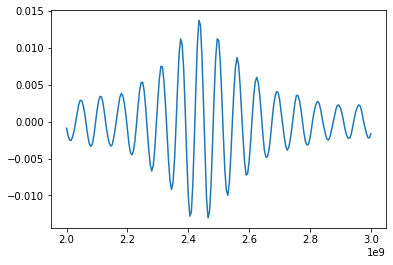

In [98]:
print(rect_ant_10deg[0,0],rect_ant_10deg[0,1],rect_ant_10deg[0,2])
plt.plot(rect_ant_10deg[:,0],rect_ant_10deg[:,2])

In [126]:
db_conv = 10*np.log(np.sqrt(rect_ant_10deg[:,1]**2 + rect_ant_10deg[:,2]**2))
db_conv = np.reshape(db_conv,(-1,1))
db_conv.shape

(201, 1)

In [127]:
db_conv2 = 10*np.log(np.sqrt(rect_ant_20deg[:,1]**2 + rect_ant_20deg[:,2]**2))
db_conv2 = np.reshape(db_conv2,(-1,1))
db_conv2.shape
db_conv3 = 10*np.log(np.sqrt(rect_ant_90deg[:,1]**2 + rect_ant_90deg[:,2]**2))
db_conv3 = np.reshape(db_conv3,(-1,1))
db_conv3.shape
db_conv4 = 10*np.log(np.sqrt(rect_ant_E10deg[:,1]**2 + rect_ant_E10deg[:,2]**2))
db_conv4 = np.reshape(db_conv4,(-1,1))
db_conv5 = 10*np.log(np.sqrt(rect_ant_E_10deg[:,1]**2 + rect_ant_E_10deg[:,2]**2))
db_conv5 = np.reshape(db_conv5,(-1,1))

In [128]:
rect_ant_10deg_conv = np.append(rect_ant_10deg,db_conv,axis=1)
rect_ant_20deg_conv = np.append(rect_ant_20deg,db_conv2,axis=1)
rect_ant_90deg_conv = np.append(rect_ant_90deg,db_conv3,axis=1)
rect_ant_E10deg_conv = np.append(rect_ant_E10deg,db_conv4,axis=1)
rect_ant_E_10deg_conv = np.append(rect_ant_E_10deg,db_conv5,axis=1)
rect_ant_E_10deg_conv.shape

(201, 4)

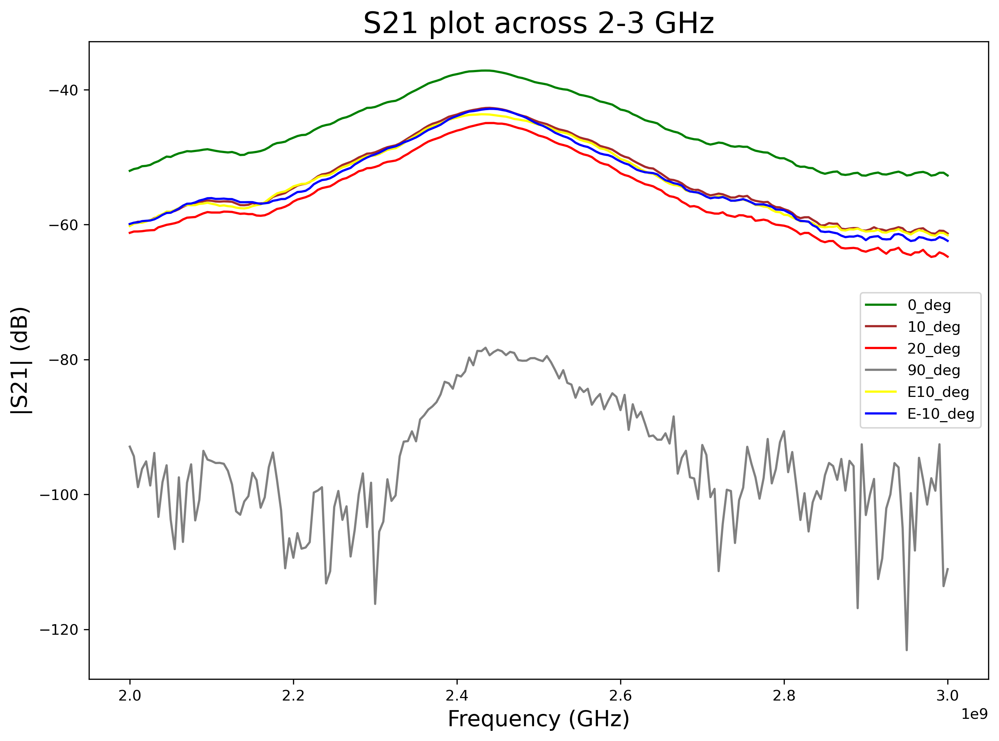

In [129]:
plt.figure(figsize = (11, 8),dpi=300)
plt.plot(rect_ant[:,0],rect_ant[:,4],color = 'green',label='0_deg')
plt.plot(rect_ant_10deg_conv[:,0],rect_ant_10deg_conv[:,3],color = 'brown',label='10_deg')
plt.plot(rect_ant_20deg_conv[:,0],rect_ant_20deg_conv[:,3],color = 'red',label='20_deg')
plt.plot(rect_ant_90deg_conv[:,0],rect_ant_90deg_conv[:,3],color = 'grey',label='90_deg')
plt.plot(rect_ant_E10deg_conv[:,0],rect_ant_E10deg_conv[:,3],color = 'yellow',label='E10_deg')
plt.plot(rect_ant_E_10deg_conv[:,0],rect_ant_E_10deg_conv[:,3],color = 'blue',label='E-10_deg')
plt.xlabel('Frequency (GHz)',fontsize=15)
plt.ylabel('|S21| (dB)',fontsize=15)
plt.title('S21 plot across 2-3 GHz',fontsize=20)
plt.legend(fontsize=15)
plt.legend()
plt.show()

In [143]:
rect_ant_az= rect_ant[:,[0,4]]
rect_ant_az.shape
print(rect_ant[0,1])

0.04917462170124054


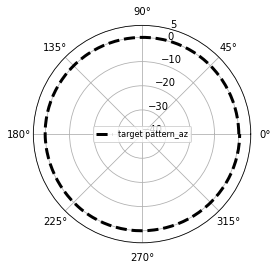

In [147]:
phi = np.linspace(0, 2*np.pi, 201)
plt.polar(phi, rect_ant[:,1],label='target pattern_az',linewidth=3,color = 'black',ls='--' )
ax = plt.gca()
ax.set_rticks([-40,-30, -20, -10, 0,5])
ax.set_rlabel_position(75)
plt.legend(fontsize=8)
plt.show()
# pat2=np.transpose(pat_mat)
# phi = np.linspace(0, 2*np.pi,26)
# plt.polar(phi, cc,linewidth=3,label='target pattern_el',color = 'green',)
# # plt.polar(phi,  zz,label='opt. design_pattern_el',linewidth=4,color = 'darkviolet')
# ax = plt.gca()
# ax.set_rticks([-10, -5, 0])
# ax.set_rlabel_position(180)
# plt.legend(fontsize=8)
plt.show()

In [845]:
E_copol= np.loadtxt('E_copol.csv',delimiter=',')
E_cross= np.loadtxt('E_cross.csv',delimiter=',')
print(E_copol.shape,E_cross.shape)
E_co = E_copol[:,2]
E_sim = E_copol[:,4]
E_X_meas = E_cross[:,2]
E_X_sim = E_cross[:,3]
H_copol= np.loadtxt('H_copol.csv',delimiter=',')
H_cross= np.loadtxt('H_cross.csv',delimiter=',')
print(H_copol.shape,H_cross.shape)
H_co = H_copol[:,2]
H_sim = H_copol[:,4]
H_X_meas = H_cross[:,2]
H_X_sim = H_cross[:,3]
tgt_rad = np.loadtxt('target_radpattern.csv',delimiter=',')
T_E = tgt_rad[:,4]
T_H = tgt_rad[:,2]
pred = np.loadtxt('ant1_pred_radpatt.csv',delimiter=',')
P_E = pred[:,2]
P_H = pred[:,4]
print(P_E.shape,P_H.shape)

(37, 5) (25, 5)
(37, 5) (25, 5)
(361,) (361,)


# Data smoothening

In [824]:
phi1 = np.linspace(0, 2*np.pi, 37)
phi2 = np.linspace(0, 2*np.pi, 25)
phi_new = np.linspace(0, 2*np.pi, 361)
interp_func1 = interp1d(phi1, E_co, kind='cubic', axis=0)
interp_func2 = interp1d(phi1, E_sim, kind='cubic', axis=0)
interp_func3 = interp1d(phi2, E_X_meas, kind='cubic', axis=0)
interp_func4 = interp1d(phi1, T_E, kind='cubic', axis=0)
E_co_new = interp_func1(phi_new)
E_sim_new = interp_func2(phi_new)
E_X_meas_new = interp_func3(phi_new)
T_E_new = interp_func4(phi_new)
print(E_co.shape,E_co_new.shape,E_sim_new.shape,T_E_new.shape)

(37,) (361,) (361,) (361,)


In [825]:
phi_new = np.linspace(0, 2*np.pi, 361)
interp_func1 = interp1d(phi1, H_co, kind='cubic', axis=0)
interp_func2 = interp1d(phi1, H_sim, kind='cubic', axis=0)
interp_func3 = interp1d(phi2, H_X_meas, kind='cubic', axis=0)
interp_func4 = interp1d(phi1, T_H, kind='cubic', axis=0)
H_co_new = interp_func1(phi_new)
H_sim_new = interp_func2(phi_new)
H_X_meas_new = interp_func3(phi_new)
T_H_new = interp_func4(phi_new)
print(H_co.shape,H_co_new.shape,H_sim_new.shape)

(37,) (361,) (361,)


/tmp/ipykernel_19592/897635165.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp1.set_yticklabels([-30,-20,-10,0],fontsize=15)


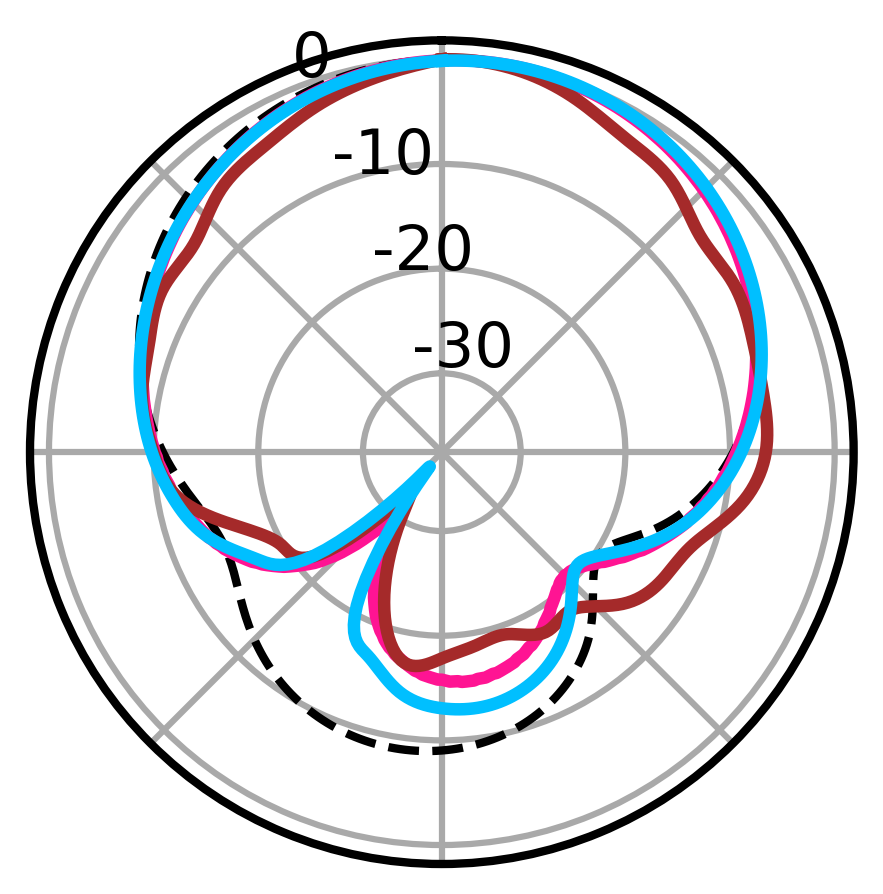

/tmp/ipykernel_19592/897635165.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp2.set_yticklabels([-30,-20,-10,0],fontsize=15)


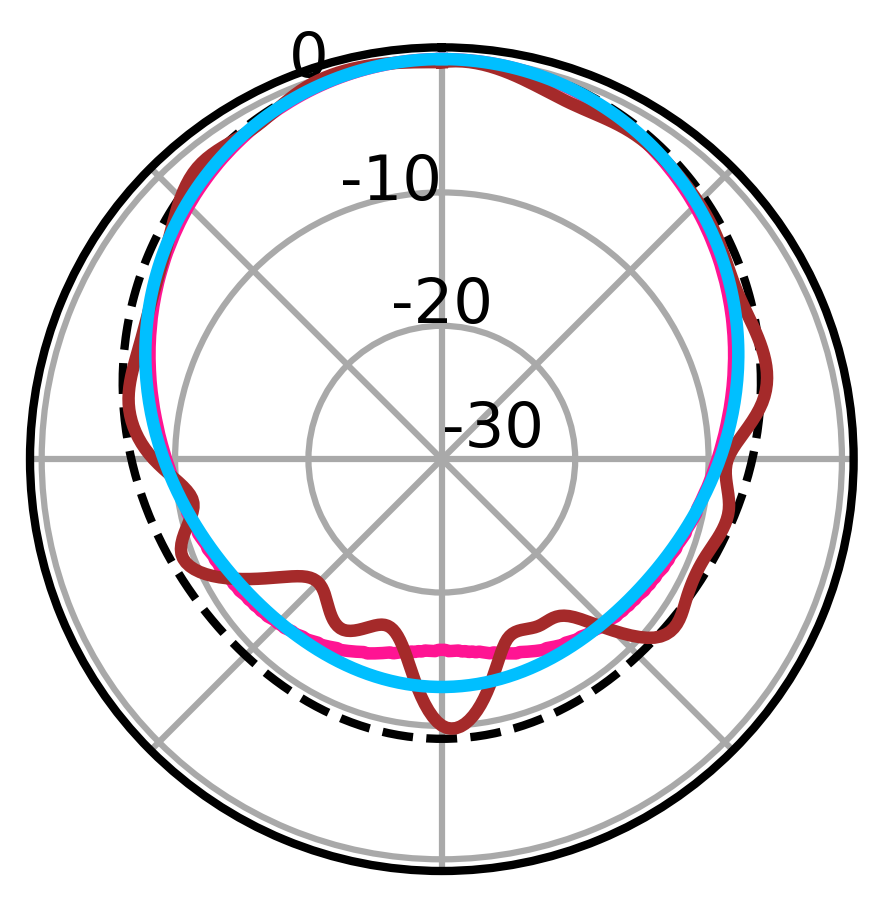

In [846]:
phi1 = np.linspace(0, 2*np.pi, 361)
phi2 = np.linspace(0, 2*np.pi, 25)
plt.figure(figsize = (11, 8),dpi=300)
sp1 = plt.subplot(2, 1, 1, projection='polar')
sp1.set_theta_zero_location('N')
sp1.set_theta_direction(-1)
ax=plt.gca()

sp1.set_xticklabels([])
sp1.set_yticklabels([-30,-20,-10,0],fontsize=15)

plt.plot(phi_new, T_E_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_E,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, E_co_new,label='Co-pol_meas.',linewidth=3,color = 'brown' )
plt.plot(phi_new, E_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue' )
# plt.polar(phi_new, E_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--' )
# plt.polar(phi2, E_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )
ax.spines['polar'].set_linewidth(2)
ax.grid(True, linewidth=1.5, color ='darkgrey')
ax.set_rlabel_position(-22.5)
ax.set_rticks([-30,-20,-10,0])
# ax.set_title('Ant-1 Normalized Rad_pattern(Xoz plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()
plt.figure(figsize = (11, 8),dpi=300)
sp2 = plt.subplot(2, 1, 2, projection='polar')
sp2.set_theta_zero_location('N')
sp2.set_theta_direction(-1)
sp2.set_xticklabels([])
sp2.set_yticklabels([-30,-20,-10,0],fontsize=15)
plt.plot(phi_new, T_H_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_H,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, H_co_new,label='Co-pol_meas.',linewidth=3,color = 'brown')
plt.plot(phi_new, H_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue')

# plt.polar(phi_new, H_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--' )
# plt.polar(phi2, H_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )
ax = plt.gca()
ax.spines['polar'].set_linewidth(2)
ax.grid(True, linewidth=1.5, color ='darkgrey')
ax.set_rticks([-30,-20,-10,0])
# ax.set_rlabel_position(75)
ax.set_rlabel_position(-22.5)
# ax.set_title('Ant-1 Normalized Rad_pattern(Yoz plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()

In [847]:
E_H_copol= np.loadtxt('E_H_co-polar_2.64G.csv',delimiter=',')
E_H_cross= np.loadtxt('E_H_cross_2.64G.csv',delimiter=',')
print(E_H_copol.shape,E_H_cross.shape)
E_co = E_H_copol[:,2]
H_co = E_H_copol[:,4]
E_X_meas = E_H_cross[:,2]
H_X_meas = E_H_cross[:,4]
pred2 = np.loadtxt('ant2_pred_radpatt.csv',delimiter=',')
P_E = pred2[:,2]
P_H = pred2[:,4]
print(P_E.shape,P_H.shape)

(37, 5) (25, 5)
(361,) (361,)


In [848]:
E_H_cosim = np.loadtxt('E_H_co_sim.csv',delimiter=',')
E_co_sim = E_H_cosim[:,2]
H_co_sim = E_H_cosim[:,4]
E_H_crosssim = np.loadtxt('E_H_cross_sim.csv',delimiter=',')
E_X_sim = E_H_crosssim[:,2]
H_X_sim = E_H_crosssim[:,4]

In [849]:
phi1 = np.linspace(0, 2*np.pi, 37)
phi2 = np.linspace(0, 2*np.pi, 25)
phi_new = np.linspace(0, 2*np.pi, 361)
interp_func1 = interp1d(phi1, E_co, kind='cubic', axis=0)
interp_func2 = interp1d(phi1, E_co_sim, kind='cubic', axis=0)
interp_func3 = interp1d(phi2, E_X_meas, kind='cubic', axis=0)
E_co_new = interp_func1(phi_new)
E_sim_new = interp_func2(phi_new)
E_X_meas_new = interp_func3(phi_new)
interp_func4 = interp1d(phi1, H_co, kind='cubic', axis=0)
interp_func5 = interp1d(phi1, H_co_sim, kind='cubic', axis=0)
interp_func6 = interp1d(phi2, H_X_meas, kind='cubic', axis=0)
H_co_new = interp_func4(phi_new)
H_sim_new = interp_func5(phi_new)
H_X_meas_new = interp_func6(phi_new)

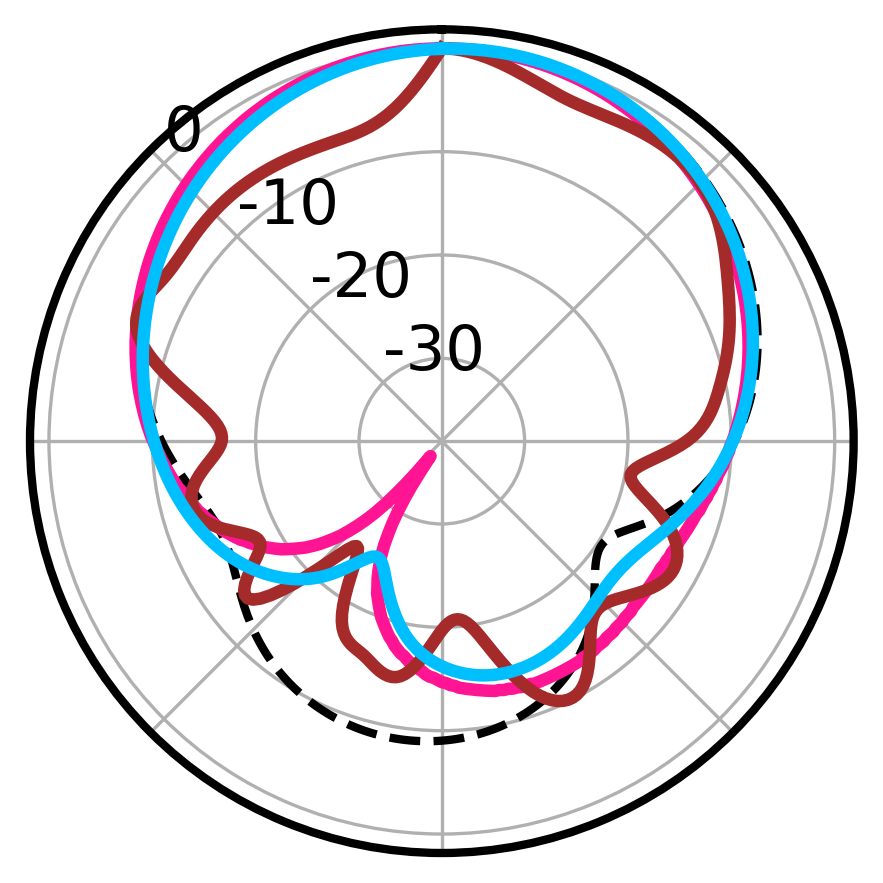

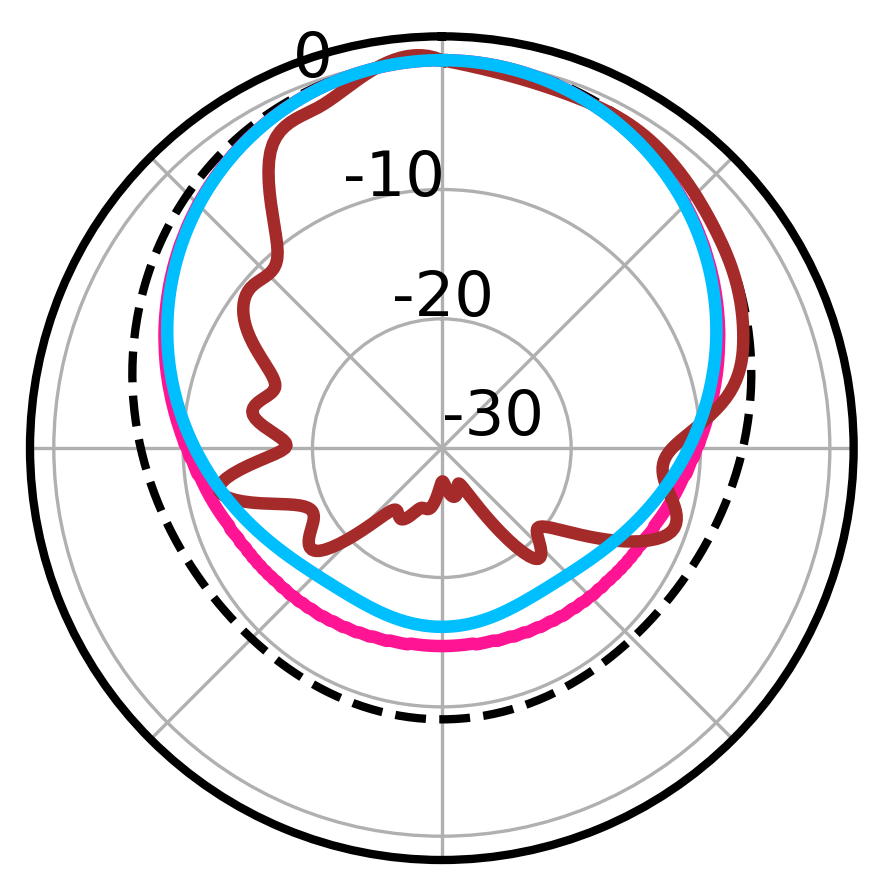

In [850]:
phi1 = np.linspace(0, 2*np.pi, 37)
phi2 = np.linspace(0, 2*np.pi, 25)
plt.figure(figsize = (11, 8),dpi=300)
sp1 = plt.subplot(2, 1, 1, projection='polar')
sp1.set_theta_zero_location('N')
sp1.set_theta_direction(-1)
ax=plt.gca()
ax.spines['polar'].set_linewidth(2)
plt.plot(phi_new, T_E_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_E,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, E_co_new,label='Co-pol_meas.',linewidth=3,color = 'brown' )
plt.plot(phi_new, E_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue' )
# plt.polar(phi_new, E_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--' )
# plt.polar(phi2, E_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )
ax.set_rlabel_position(315)
ax.set_rticks([-30,-20,-10,0])
sp1.set_xticklabels([])
sp1.set_yticklabels([-30,-20,-10,0],fontsize=15)
# ax.set_title('Ant-3 Normalized Rad_pattern(XZ plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()


plt.figure(figsize = (11, 8),dpi=300)
sp2 = plt.subplot(2, 1, 2, projection='polar')
sp2.set_theta_zero_location('N')
sp2.set_theta_direction(-1)
plt.plot(phi_new, T_H_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_H,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, H_co_new,label='Co-pol_meas.',linewidth=3,color = 'brown' )
plt.plot(phi_new, H_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue')

# plt.polar(phi_new, H_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--' )
# plt.polar(phi2, H_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )
ax = plt.gca()
ax.spines['polar'].set_linewidth(2)
ax.set_rticks([-30,-20,-10,0])
sp2.set_xticklabels([])
sp2.set_yticklabels([-30,-20,-10,0],fontsize=15)
ax.set_rlabel_position(-22.5)
# ax.set_title('Ant-3 Normalized Rad_pattern(YZ plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()

In [869]:
E_H_copol= np.loadtxt('E_H_co-polar_dual.csv',delimiter=',')
E_H_cross= np.loadtxt('E_H_cross_dual.csv',delimiter=',')
print(E_H_copol.shape,E_H_cross.shape)
E_co1 = E_H_copol[:,2]
H_co1 = E_H_copol[:,4]
E_co2 = E_H_copol[:,6]
H_co2 = E_H_copol[:,8]
E_X_meas1 = E_H_cross[:,2]
H_X_meas1 = E_H_cross[:,4]
E_X_meas2 = E_H_cross[:,6]
H_X_meas2 = E_H_cross[:,8]

(37, 9) (25, 9)


In [868]:
E_H_cosim1 = np.loadtxt('E_H_co_sim(2.12G).csv',delimiter=',')
E_co_sim1 = E_H_cosim1[:,2]
H_co_sim1 = E_H_cosim1[:,4]
E_H_cosim2 = np.loadtxt('E_H_co_sim(2.9G).csv',delimiter=',')
E_co_sim2 = E_H_cosim2[:,2]
H_co_sim2 = E_H_cosim2[:,4]
pred4 = np.loadtxt('ant2.9_pred_radpatt.csv',delimiter=',')
P_E = pred4[:,2]
P_H = pred4[:,4]
pred3 = np.loadtxt('ant2.2_pred_radpatt.csv',delimiter=',')
P_E1 = pred3[:,2]
P_H1 = pred3[:,4]
print(P_E1.shape,P_H1.shape)

(361,) (361,)


In [870]:
phi1 = np.linspace(0, 2*np.pi, 37)
phi2 = np.linspace(0, 2*np.pi, 25)
phi_new = np.linspace(0, 2*np.pi, 361)
interp_func1 = interp1d(phi1, E_co1, kind='cubic', axis=0)
interp_func2 = interp1d(phi1, E_co_sim1, kind='cubic', axis=0)
interp_func3 = interp1d(phi2, E_X_meas1, kind='cubic', axis=0)
E_co_new = interp_func1(phi_new)
E_sim_new = interp_func2(phi_new)
E_X_meas_new = interp_func3(phi_new)
interp_func4 = interp1d(phi1, H_co1, kind='cubic', axis=0)
interp_func5 = interp1d(phi1, H_co_sim1, kind='cubic', axis=0)
interp_func6 = interp1d(phi2, H_X_meas1, kind='cubic', axis=0)
H_co_new = interp_func4(phi_new)
H_sim_new = interp_func5(phi_new)
H_X_meas_new = interp_func6(phi_new)
# print(E_co.shape,E_co_new.shape,E_sim_new.shape)

/tmp/ipykernel_19592/4106863760.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp1.set_yticklabels([-30,-20,-10,0],fontsize=15)


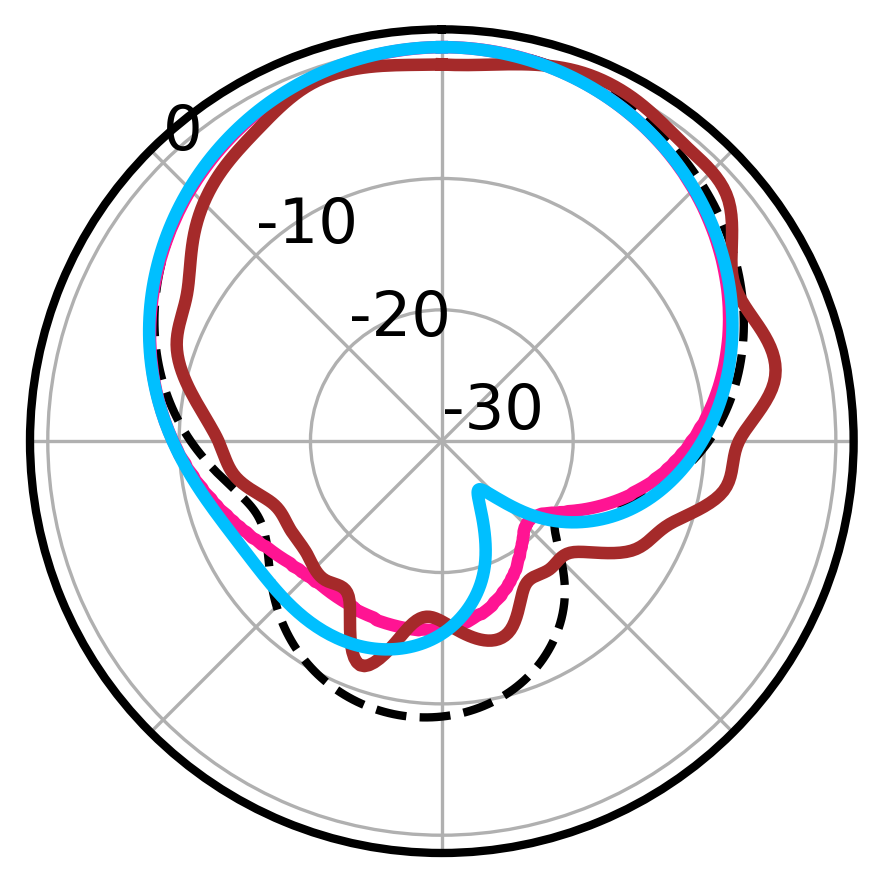

/tmp/ipykernel_19592/4106863760.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp2.set_yticklabels([-30,-20,-10,0],fontsize=15)


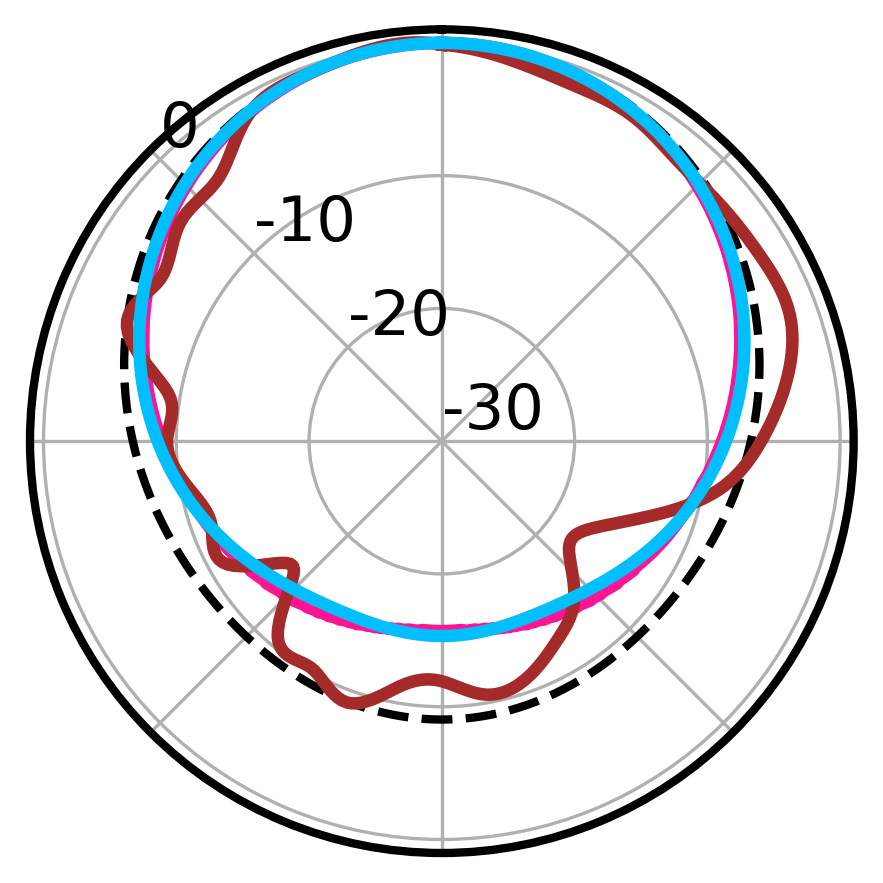

In [872]:
phi1 = np.linspace(0, 2*np.pi, 37)
phi2 = np.linspace(0, 2*np.pi, 25)
plt.figure(figsize = (11, 8),dpi=300)
sp1 = plt.subplot(2, 1, 1, projection='polar')
sp1.set_theta_zero_location('N')
sp1.set_theta_direction(-1)
sp1.set_xticklabels([])
sp1.set_yticklabels([-30,-20,-10,0],fontsize=15)
ax=plt.gca()
ax.spines['polar'].set_linewidth(2)
plt.plot(phi_new, T_E_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_E1,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, E_co_new,label='Co-pol_meas.',linewidth=3,color = 'brown' )
plt.plot(phi_new, E_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue' )

# plt.polar(phi_new, E_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--' )
# plt.polar(phi2, E_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )


ax.set_rlabel_position(315)
ax.set_rticks([-30,-20,-10,0])
# ax.set_title('Ant-2 2.12(GHz) Rad_pattern(XZ plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()
plt.figure(figsize = (11, 8),dpi=300)
sp2 = plt.subplot(2, 1, 2, projection='polar')
sp2.set_theta_zero_location('N')
sp2.set_theta_direction(-1)
sp2.set_xticklabels([])
sp2.set_yticklabels([-30,-20,-10,0],fontsize=15)
plt.plot(phi_new, T_H_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_H1,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, H_co_new,label='Co-pol_meas.',linewidth=3,color = 'brown')
plt.plot(phi_new, H_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue')

# plt.polar(phi_new, H_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--')
# plt.polar(phi2, H_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )
ax = plt.gca()
ax.spines['polar'].set_linewidth(2)
ax.set_rticks([-30,-20,-10,0])
# ax.set_rlabel_position(75)
ax.set_rlabel_position(315)
# ax.set_title('Ant-2 2.12(GHz) Rad_pattern(YZ plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()

In [856]:
phi1 = np.linspace(0, 2*np.pi, 37)
phi2 = np.linspace(0, 2*np.pi, 25)
phi_new = np.linspace(0, 2*np.pi, 361)
interp_func1 = interp1d(phi1, E_co2, kind='cubic', axis=0)
interp_func2 = interp1d(phi1, E_co_sim2, kind='cubic', axis=0)
interp_func3 = interp1d(phi2, E_X_meas2, kind='cubic', axis=0)
E_co_2 = interp_func1(phi_new)
E_sim_new = interp_func2(phi_new)
E_X_meas_new = interp_func3(phi_new)
interp_func4 = interp1d(phi1, H_co2, kind='cubic', axis=0)
interp_func5 = interp1d(phi1, H_co_sim2, kind='cubic', axis=0)
interp_func6 = interp1d(phi2, H_X_meas2, kind='cubic', axis=0)
H_co_2 = interp_func4(phi_new)
H_sim_new = interp_func5(phi_new)
H_X_meas_new = interp_func6(phi_new)
print(E_co2.shape,E_co_new.shape,H_co2.shape,E_sim_new.shape)

(37,) (361,) (37,) (361,)


/tmp/ipykernel_19592/3438048251.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp1.set_yticklabels([-30,-20,-10,0],fontsize=15)


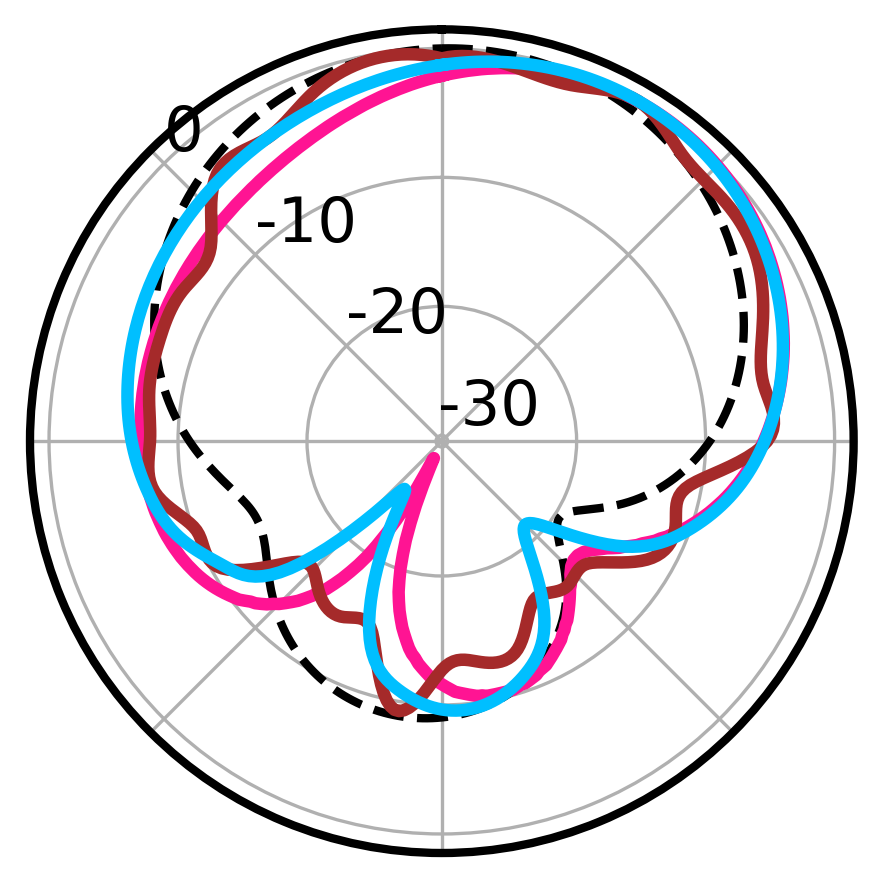

/tmp/ipykernel_19592/3438048251.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  sp2.set_yticklabels([-30,-20,-10,0],fontsize=15)


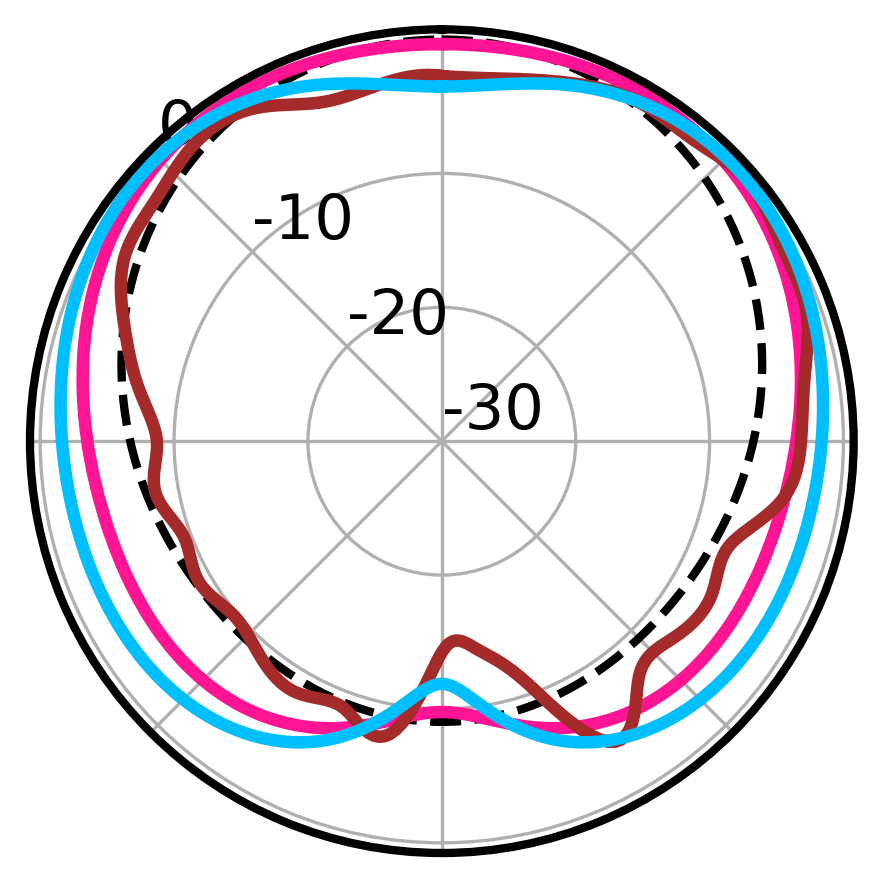

In [857]:
phi1 = np.linspace(0, 2*np.pi, 37)
phi2 = np.linspace(0, 2*np.pi, 25)
plt.figure(figsize = (11, 8),dpi=300)
sp1 = plt.subplot(2, 1, 1, projection='polar')
sp1.set_theta_zero_location('N')
sp1.set_theta_direction(-1)
ax=plt.gca()
sp1.set_xticklabels([])
sp1.set_yticklabels([-30,-20,-10,0],fontsize=15)
plt.plot(phi_new, T_E_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_E,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, E_co_2,label='Co-pol_meas.',linewidth=3,color = 'brown' )
plt.plot(phi_new, E_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue' )

# plt.polar(phi_new, E_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--' )
# plt.polar(phi2, E_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )

ax.spines['polar'].set_linewidth(2)
ax.set_rlabel_position(315)
ax.set_rticks([-30,-20,-10,0])
# ax.set_title('Ant-2 2.9(GHz) Rad_pattern(XZ plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()
plt.figure(figsize = (11, 8),dpi=300)
sp2 = plt.subplot(2, 1, 2, projection='polar')
sp2.set_theta_zero_location('N')
sp2.set_theta_direction(-1)
sp2.set_xticklabels([])
sp2.set_yticklabels([-30,-20,-10,0],fontsize=15)
plt.plot(phi_new, T_H_new,label='Target.',linewidth=2,color = 'black',ls='--'  )
plt.plot(phi_new, P_H,label='predicted',linewidth=3,color = 'deeppink' )
plt.plot(phi_new, H_co_2,label='Co-pol_meas.',linewidth=3,color = 'brown')
plt.plot(phi_new, H_sim_new,label='Co-pol_sim.',linewidth=3,color = 'deepskyblue')

# plt.polar(phi_new, H_X_meas_new,label='X-pol_meas.',linewidth=1,color = 'black',ls='--')
# plt.polar(phi2, H_X_sim,label='X-pol_sim.',linewidth=1,color = 'brown',ls='--' )
ax = plt.gca()
ax.spines['polar'].set_linewidth(2)
ax.set_rticks([-30,-20,-10,0])
# ax.set_rlabel_position(75)
ax.set_rlabel_position(315)
# ax.set_title('Ant-2 2.9(GHz) Rad_pattern(YZ plane)',fontsize=15, va='bottom')
# plt.legend(fontsize=10,loc='lower right')
plt.show()

# Model Predictions

Data acquisition and preprocessing

In [166]:
P1 = np.loadtxt('patt_batch2-10K.txt')
S1=np.loadtxt('S11_batch2-10K.txt')
I1 = np.loadtxt('imp_batch2-10K.txt')
Z1= I1[:,0:128]
# np.shape(Z2)

In [167]:
s11= S1/10
s11=10**s11
np.max(s11)
patt=P1/10
patt=10**patt
np.max(patt)

563.4404211463883

In [171]:
yy=np.concatenate((patt,s11,Z1),axis=1)
yy.shape

(9169, 41856)

In [172]:
x1=np.loadtxt("X_batch2-10K.txt")
x1=x1[:,0:8]
y1=np.loadtxt("Y_batch2-10K.txt")
y1=y1[:,0:8]
xy=np.concatenate((x1,y1),axis=1)
xy.shape

(9169, 16)

In [173]:
lower = np.array([-0.03,-0.03,-0.03,-0.03,-0.03,-0.03,-0.03,-0.03,
                  -0.03,-0.03,-0.03,-0.03,-0.03,-0.03,-0.03,-0.03])
                  

upper = np.array([0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,
                  0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03])
                  
for i in range (np.shape(xy)[0]):
    xy[i] = (xy[i]-lower)/(upper-lower)
np.max(xy)

0.9983333333333333

In [166]:
modelb = load_model('best_model2.h5')

In [167]:
with tf.device('/device:GPU:1'):
    y_pred = modelb.predict(xy)
    err = np.mean((yy - y_pred)**2)
    print(err)

129.23883763954586


In [186]:
y1_te=yy[:,0:41600]
y1_pred=y_pred[:,0:41600]
y2_te=yy[:,41600:41728]
y2_pred=y_pred[:,41600:41728]
y3_te=yy[:,41728:41856]
y3_pred=y_pred[:,41728:41856]

In [187]:
y2_te= 10*np.log(y2_te)
y2_pred= 10*np.log(y2_pred)
# y1_te= 10*np.log(y1_te)
# y1_pre= 10*np.log(y1_pre)

/tmp/ipykernel_26731/649603092.py:2: RuntimeWarning: invalid value encountered in log
  y2_pred= 10*np.log(y2_pred)


In [188]:
y1_te=np.reshape(y1_te,(9169,13,25,128))
y1_pre =np.reshape(y1_pred,(9169,13,25,128))

In [189]:
y1_te=np.swapaxes(y1_te,1,3)
y1_pre=np.swapaxes(y1_pre,1,3)

4880


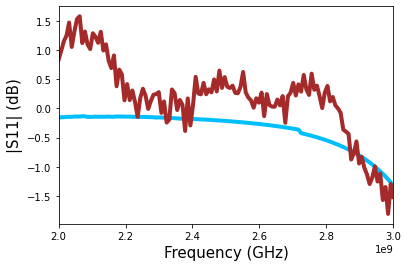

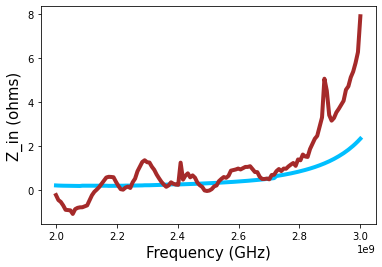

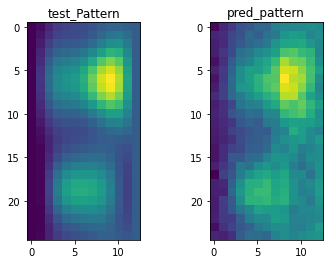

In [219]:
freq = np.linspace(2e9,3e9,128)
rr = np.random.randint(9168)
print(rr)
# rr=4928
# plt.figure(figsize = (11, 8),dpi=300)
plt.plot(freq,(y2_te[rr]),label='ground truth',linewidth=4,color = 'deepskyblue')
plt.plot(freq,(y2_pred[rr]),label='Model predicted',linewidth=4,color = 'brown')
# plt.title('S11 predictions', fontsize=30)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Frequency (GHz)',fontsize=15)
plt.ylabel('|S11| (dB)',fontsize=15)
# plt.legend(fontsize=15)
# plt.ylim(-60,1)
plt.xlim(2e9,3e9)
plt.show()

#Imp 1D plot
# plt.figure(figsize = (11, 8),dpi=300)
plt.plot(freq,y3_te[rr],label='ground truth',linewidth=4,color = 'deepskyblue')
plt.plot(freq,y3_pred[rr],label='Model predicted',linewidth=4,color = 'brown')
# plt.title('Zo predictions',fontsize=30)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Frequency (GHz)',fontsize=15)
plt.ylabel('Z_in (ohms)',fontsize=15)
# plt.legend(fontsize=15)
# plt.ylim(0,1)
plt.show()

ff=90
# print(ff)
pattern1=y1_te[rr,ff,:,:]
pattern2=y1_pre[rr,ff,:,:]
# pattern heatmap
fig,(ax1,ax2) = plt.subplots(1,2)
ax1.imshow(pattern1)
ax1.set_title('test_Pattern')
ax2.imshow(pattern2)
ax2.set_title('pred_pattern')
fig.show()

1926


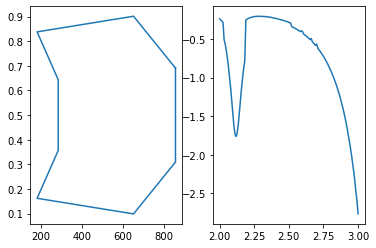

In [296]:
rr= np.random.randint(2037)
print(rr)
# rr=5076
act=xy[rr]
x= np.append(act[0:8],act[0])
x=x*1000
y = np.append(act[8:16],act[8])
# y=y*1000
s11 = yy[:,41600:41728]
s11.shape
freq = np.linspace(2,3,128)
# print(x,y)
fig, (ax1, ax2) = plt.subplots(1, 2)
# plt.subplot(2,1,1)
ax1.plot(x,y)
# ax1.xlim(-30,30)
# ax1.ylim(-30,30)
ax2.plot(freq,10*np.log(s11[rr]))
plt.show()

In [220]:
pattern1 = np.append(pattern1[:,:],pattern1[0,:])
pattern1.shape

(338,)

IndexError: index 13 is out of bounds for axis 1 with size 13

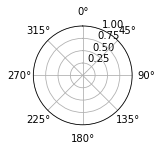

In [215]:
phi1 = np.linspace(0, 2*np.pi, 26)
phi2 = np.linspace(0, 2*np.pi, 14)
sp1 = plt.subplot(2, 1, 1, projection='polar')
sp1.set_theta_zero_location('N')
sp1.set_theta_direction(-1)
# fig=plt.figure(figsize = (11, 8),dpi=300)
# sp1.figure(figsize = (11, 8),dpi=300)
plt.polar(phi1, pattern1[:,13],label='Ground Truth',linewidth=4,color = 'dodgerblue' )
plt.polar(phi1, pattern2[:,13],label='Predicted',linewidth=4,color = 'darkviolet',ls='--')
plt.polar(phi2, pattern1[25,:],linewidth=4,label='Ground Truth',color = 'black')
plt.polar(phi2,  pattern2[25,:],label='Predicted',linewidth=4,color = 'brown',ls='--')
ax = plt.gca()
ax.set_rticks([-10, -5, 0])
# ax.set_rlabel_position(75)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
# plt.legend(fontsize=10)
# plt.title('Pattern(H-plane)',fontsize=15)
plt.show()


In [216]:
pattern1.shape

(25, 13)

In [49]:
M=np.loadtxt('fitness_mat')
# S=np.loadtxt('Data_bfits-mat.txt')
# print(M.shape,S.shape)

<Figure size 3300x2400 with 0 Axes>

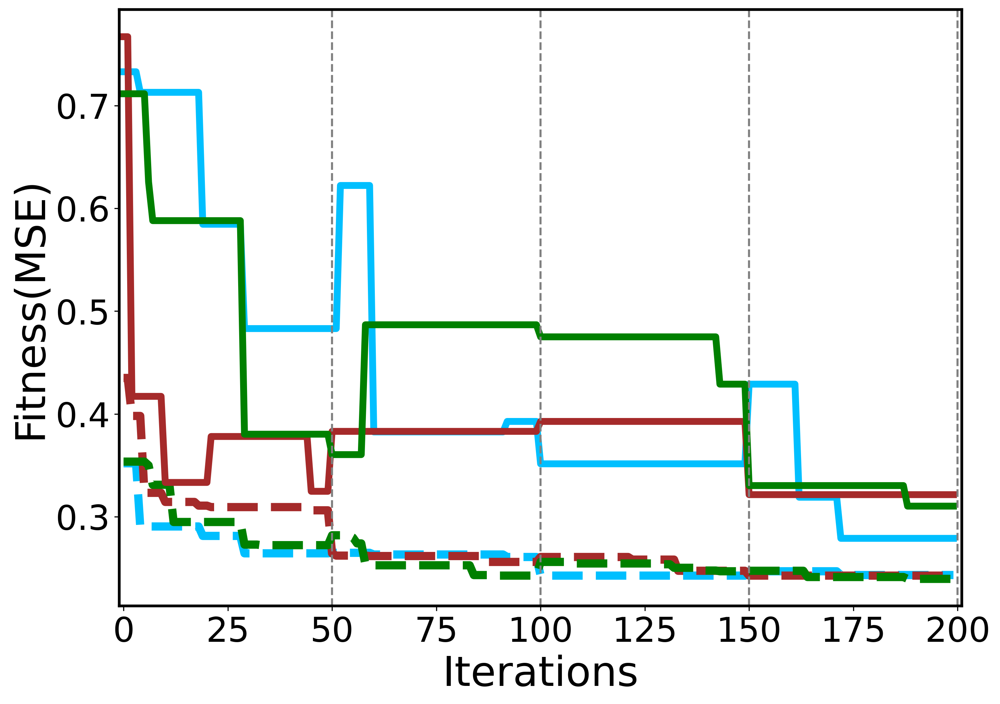

In [67]:
plt.figure(figsize = (11, 8),dpi=300)



pf1=[]
pf2=[]
pf3=[]
with open ("Data_bfits-mat.txt","r") as f:
    for line in f:
        p=line.split()
#         print(p[1])
        pf1.append(float(p[1][1:]))
        pf2.append(float(p[2][:]))
        pf3.append(float(p[3][:-1]))
plt.figure(figsize = (11, 8),dpi=300)    
plt.plot(pf1,label='Surrogate_fitness_isl1',linewidth=6,ls='dashed',color = 'deepskyblue')
plt.plot(pf2,label='Surrogate_fitness_isl2',linewidth=6,ls='dashed',color = 'brown')
plt.plot(pf3,label='Surrogate_fitness_isl3',linewidth=6,ls='dashed',color = 'green')
plt.plot(M[:,0],label='Actual_fitness_isl1',linewidth=5,color = 'deepskyblue')
plt.plot(M[:,1],label='Actual_fitness_isl2',linewidth=5,color = 'brown')
plt.plot(M[:,2],label='Actual_fitness_isl3',linewidth=5,color = 'green')
ax = plt.gca()
ax.spines['top'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
# ax.yaxis.set_major_locator(MultipleLocator(0.05))
plt.axvline(x=50, label='epochs',color='grey', linestyle='--')
plt.axvline(x=100, color='grey', linestyle='--')
plt.axvline(x=150, color='grey', linestyle='--')
plt.axvline(x=200, color='grey', linestyle='--')
plt.xlabel('Iterations',fontsize=30)
plt.ylabel('Fitness(MSE)',fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
# plt.legend(fontsize=20)
plt.xlim(-1,201)

# plt.savefig('mat_surrogat_fitn.png')
plt.show()    

In [4]:
best=np.loadtxt('Data_best_matlab.txt')

In [27]:
len(best)

300

0


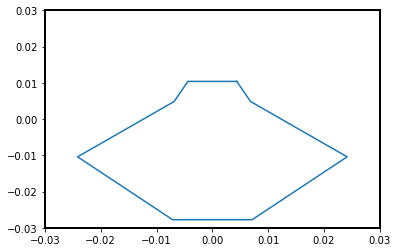

1


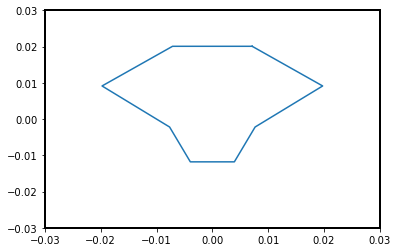

2


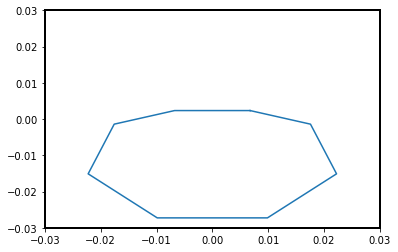

3


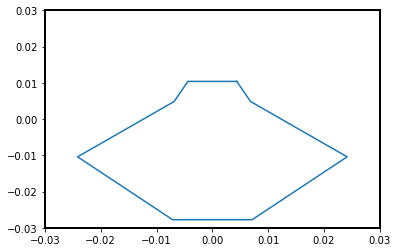

4


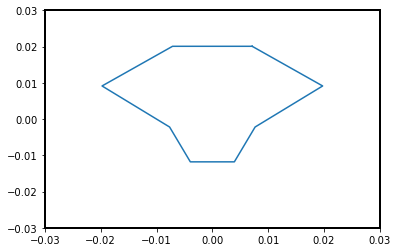

5


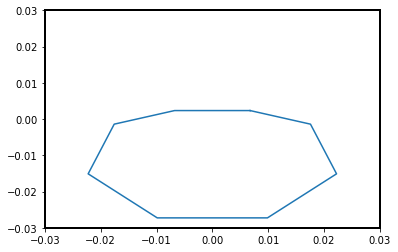

6


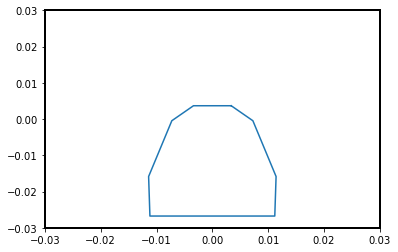

7


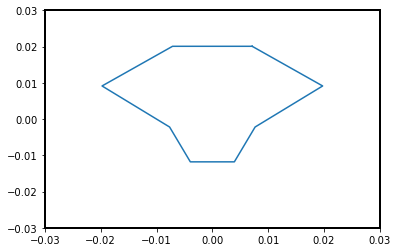

8


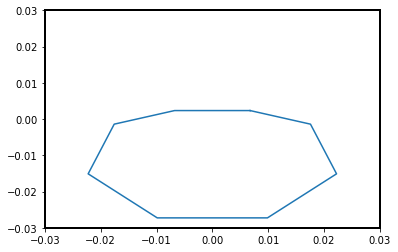

9


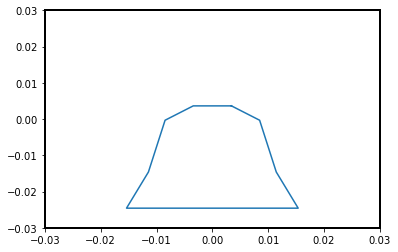

10


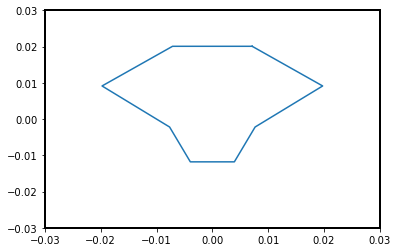

11


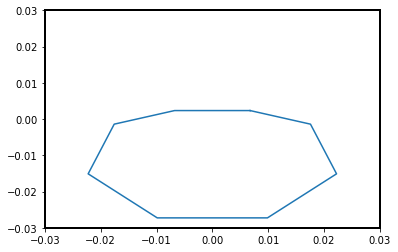

12


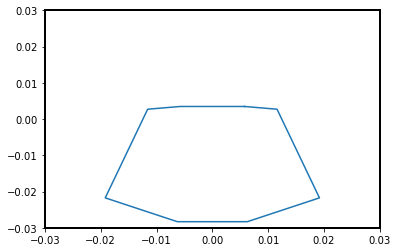

13


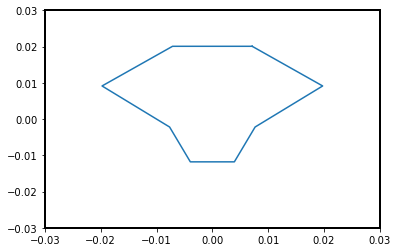

14


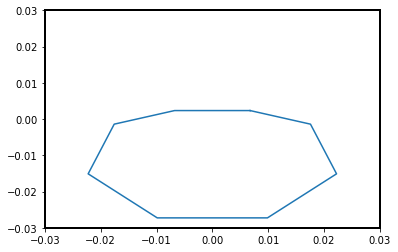

15


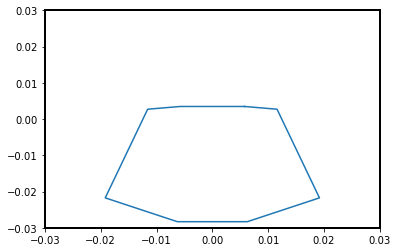

16


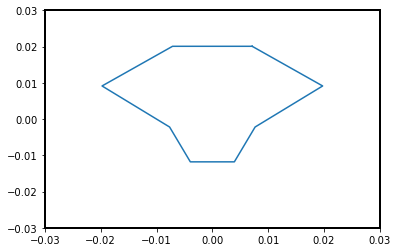

17


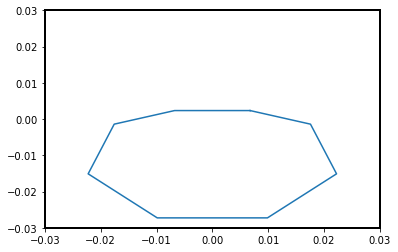

18


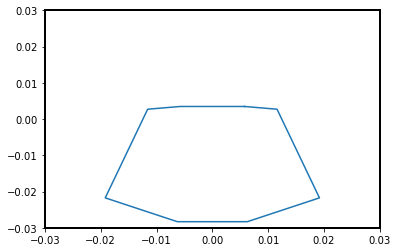

19


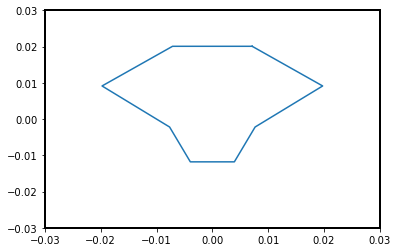

20


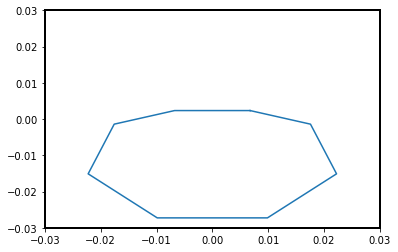

21


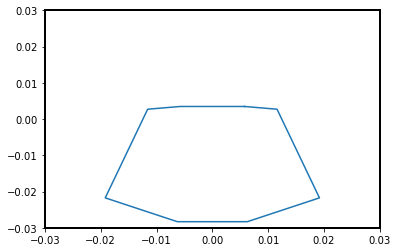

22


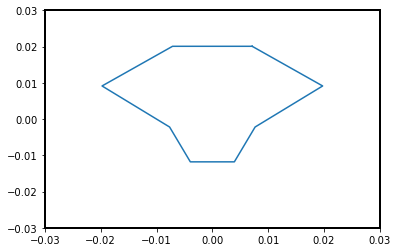

23


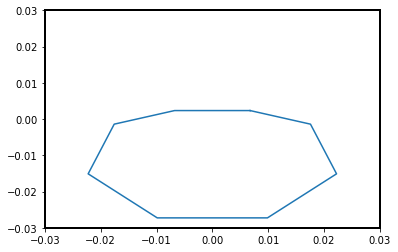

24


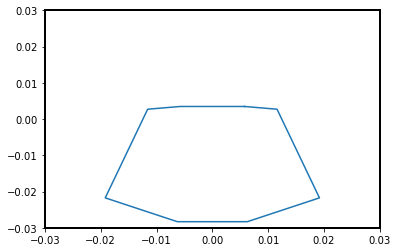

25


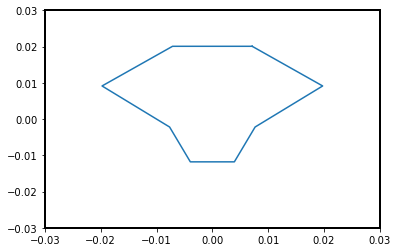

26


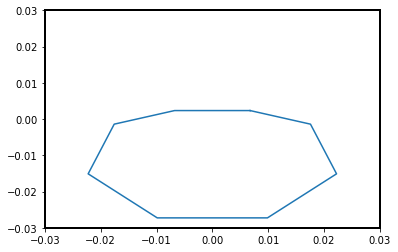

27


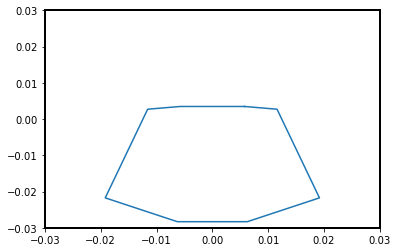

28


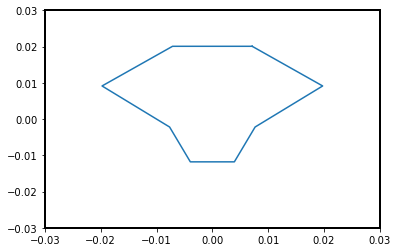

29


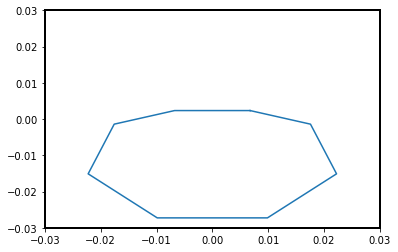

30


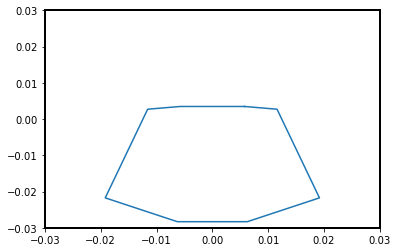

31


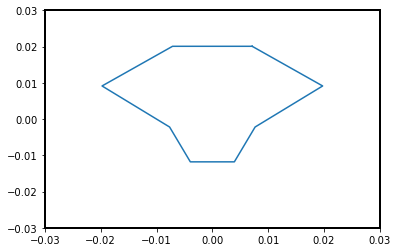

32


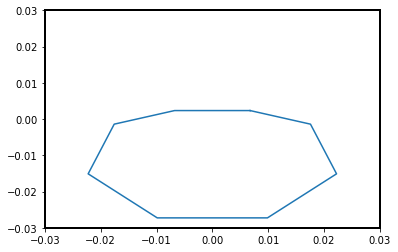

33


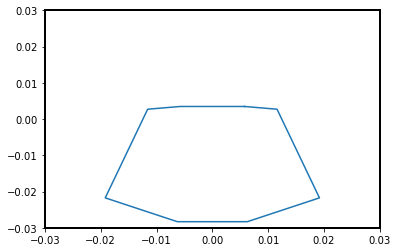

34


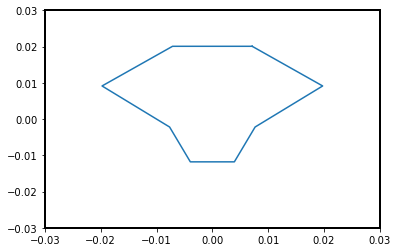

35


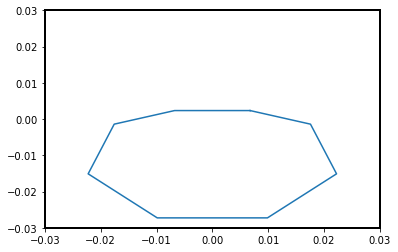

36


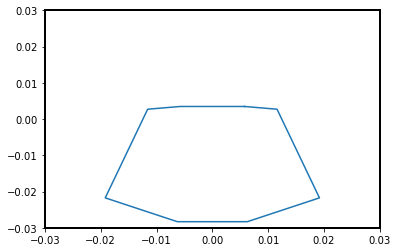

37


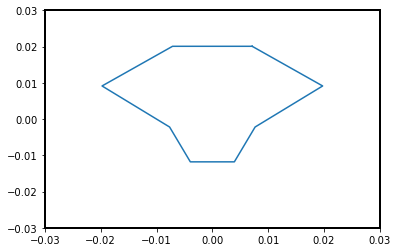

38


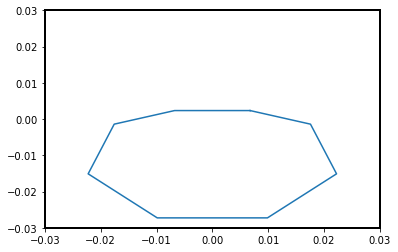

39


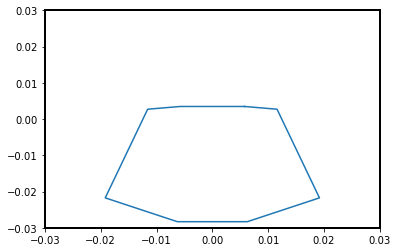

40


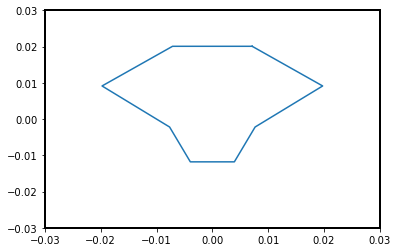

41


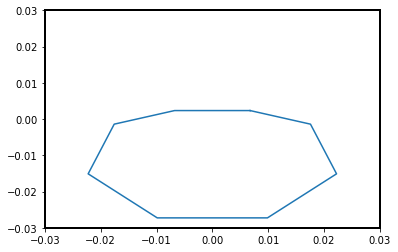

42


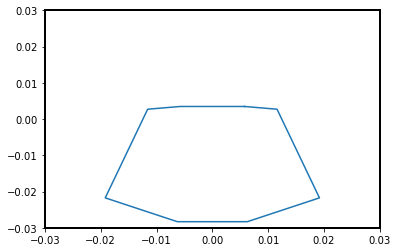

43


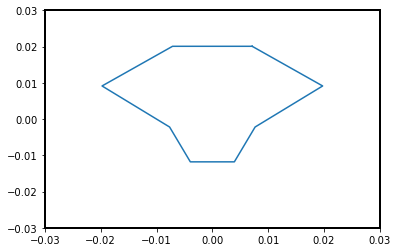

44


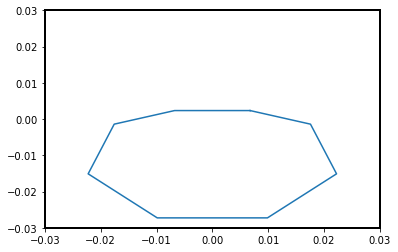

45


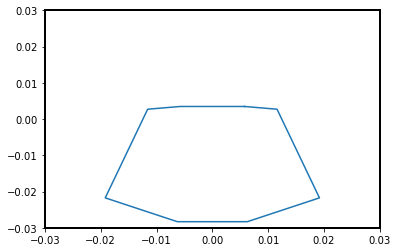

46


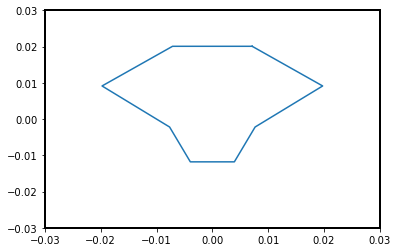

47


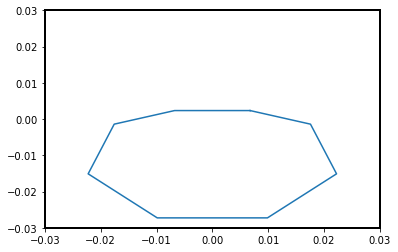

48


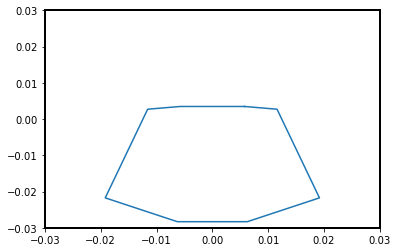

49


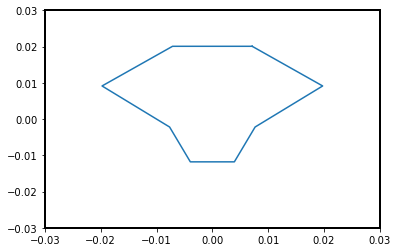

50


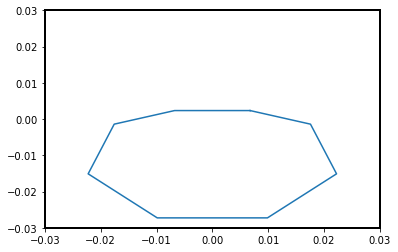

51


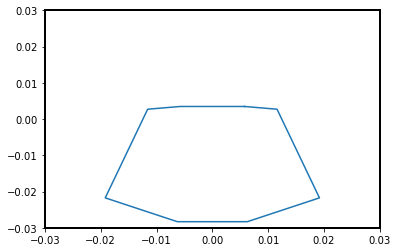

52


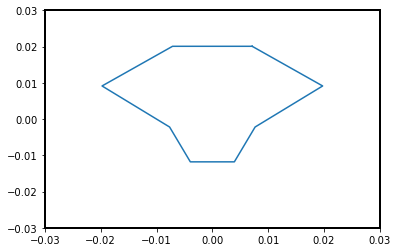

53


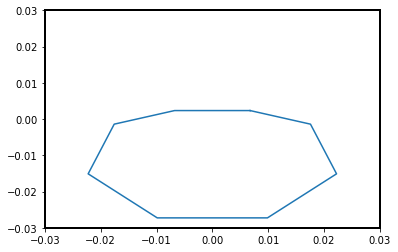

54


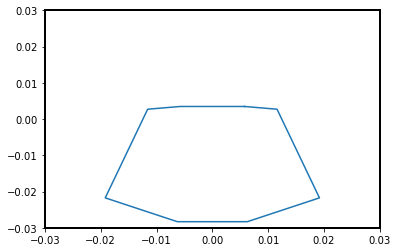

55


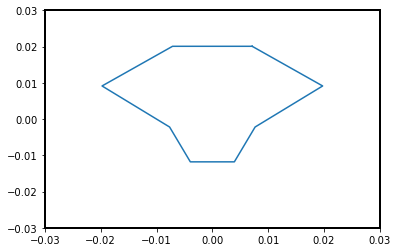

56


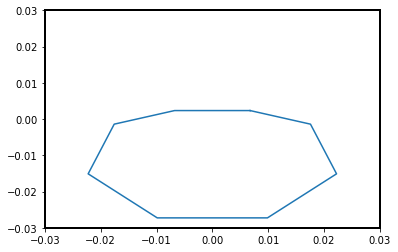

57


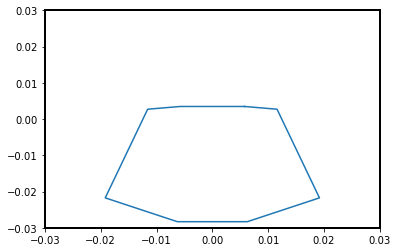

58


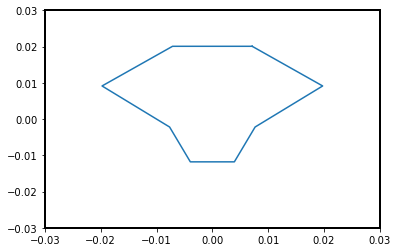

59


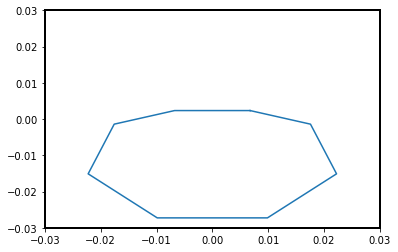

60


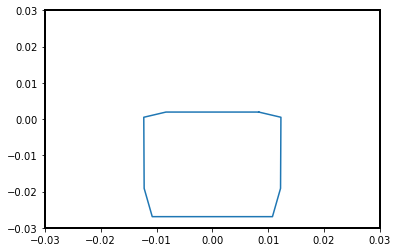

61


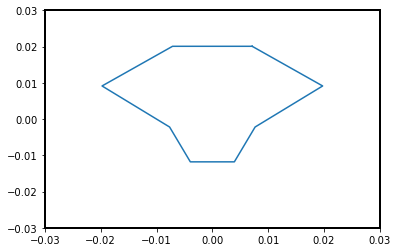

62


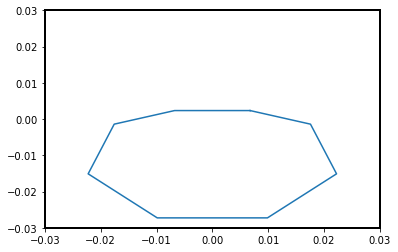

63


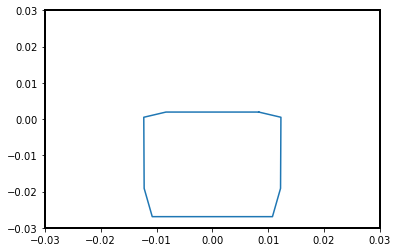

64


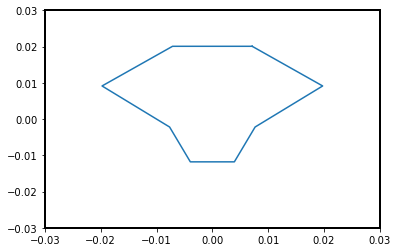

65


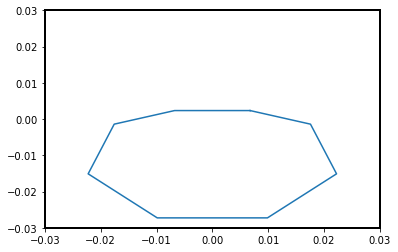

66


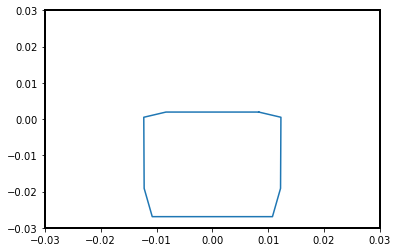

67


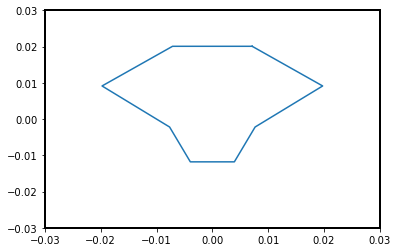

68


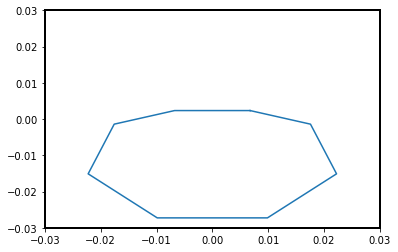

69


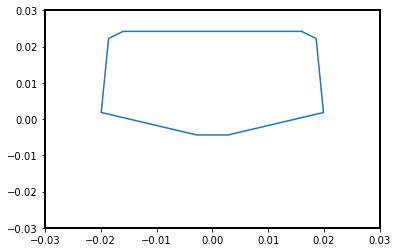

70


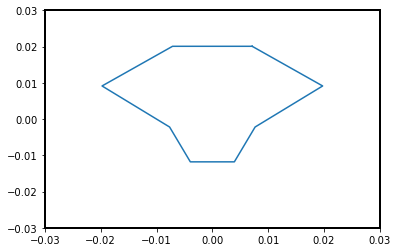

71


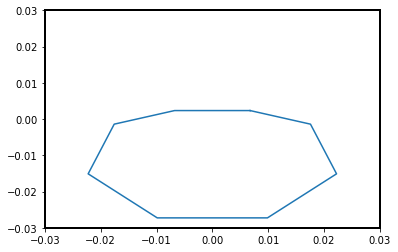

72


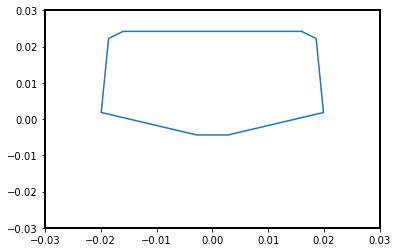

73


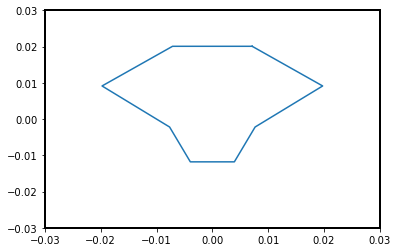

74


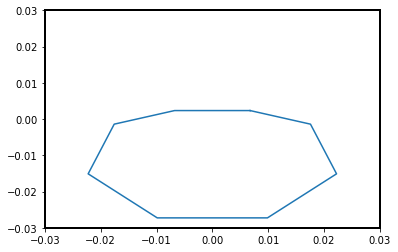

75


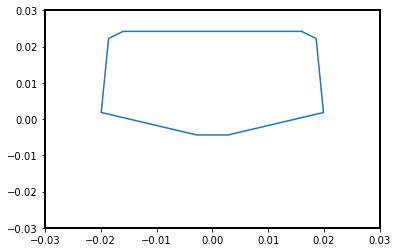

76


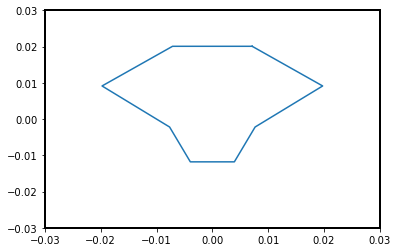

77


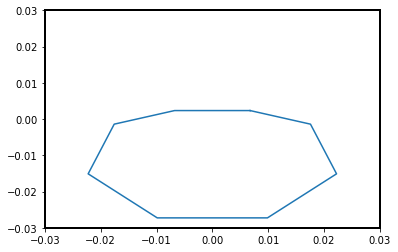

78


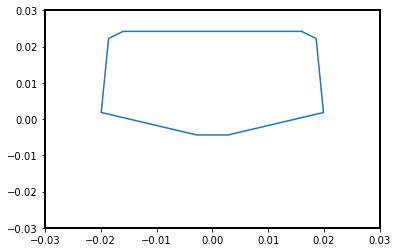

79


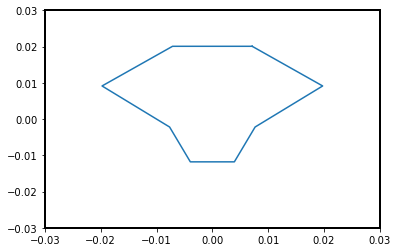

80


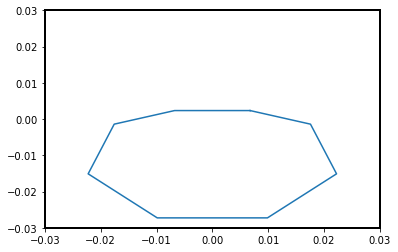

81


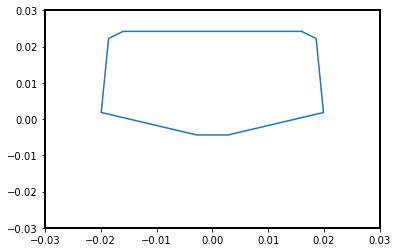

82


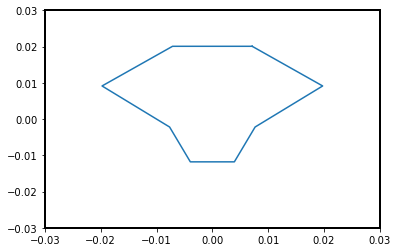

83


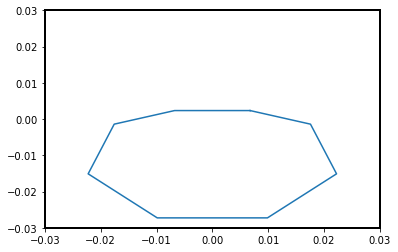

84


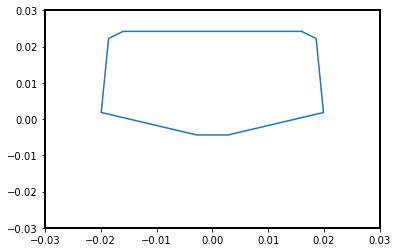

85


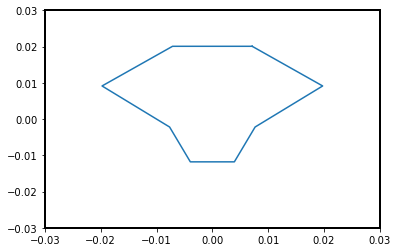

86


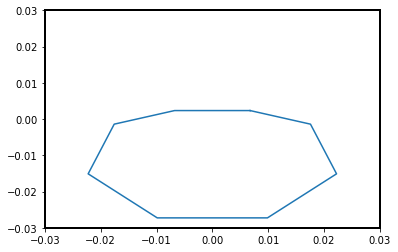

87


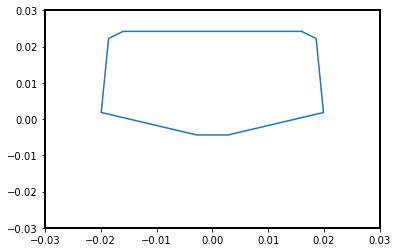

88


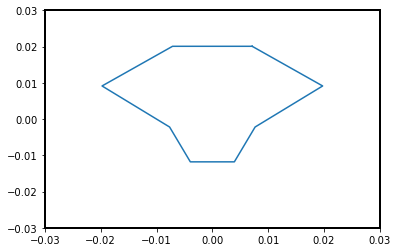

89


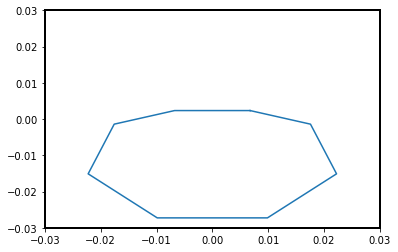

90


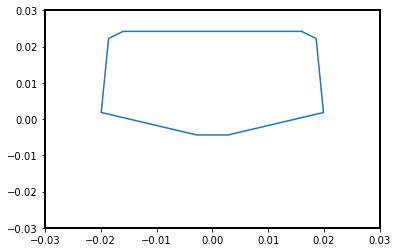

91


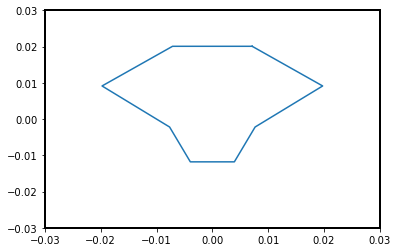

92


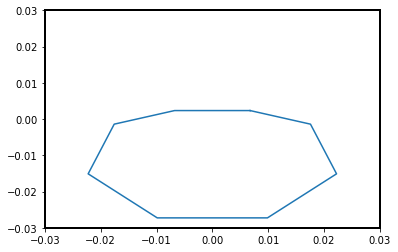

93


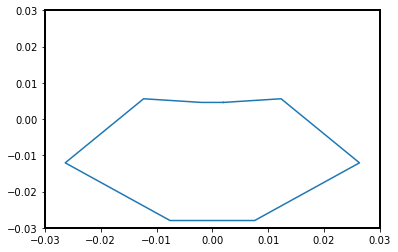

94


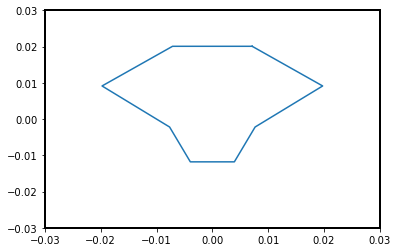

95


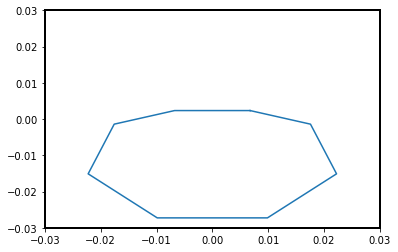

96


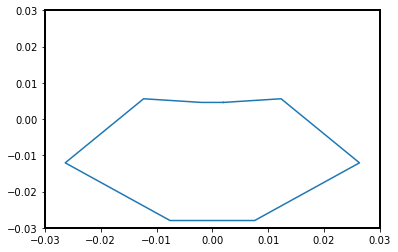

97


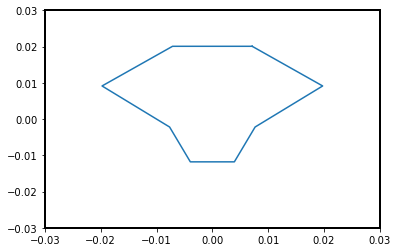

98


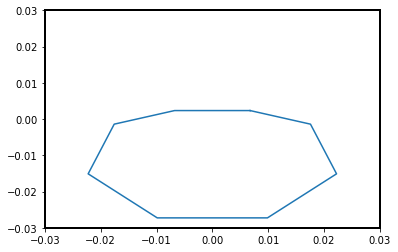

99


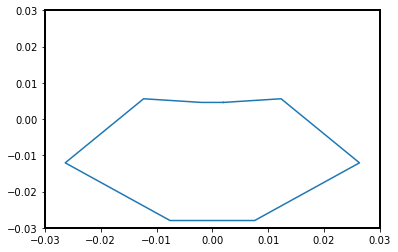

100


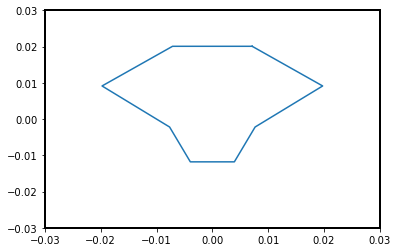

101


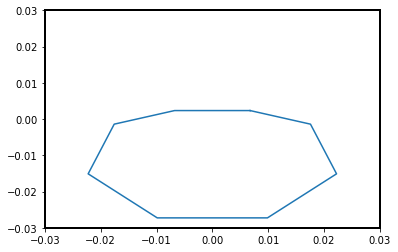

102


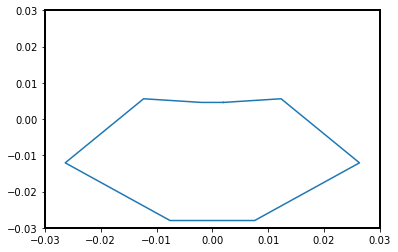

103


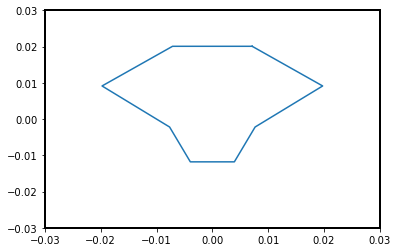

104


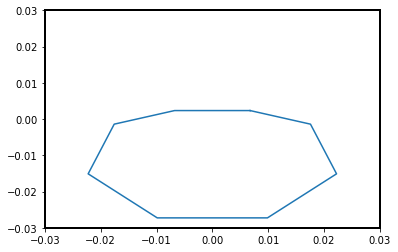

105


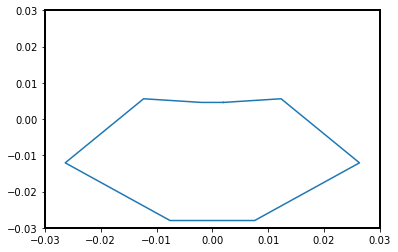

106


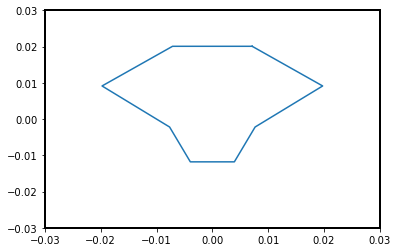

107


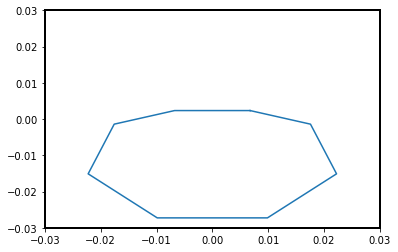

108


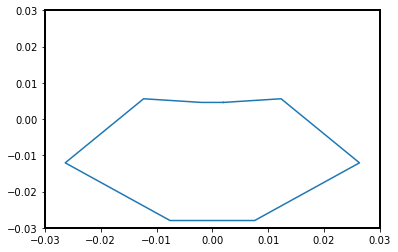

109


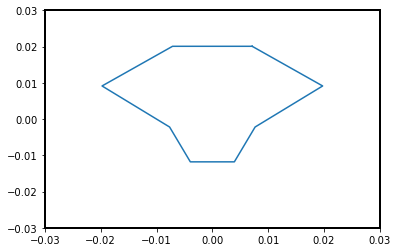

110


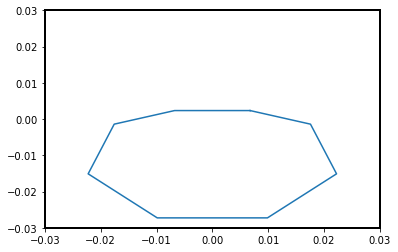

111


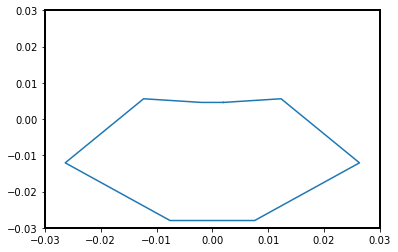

112


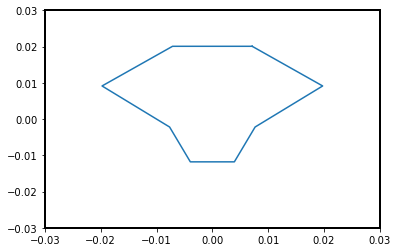

113


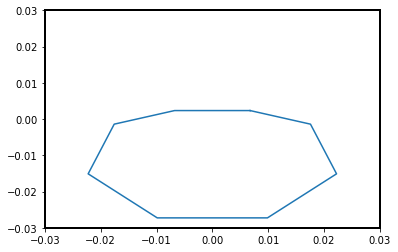

114


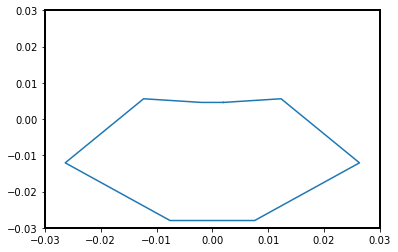

115


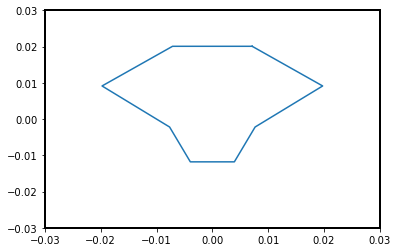

116


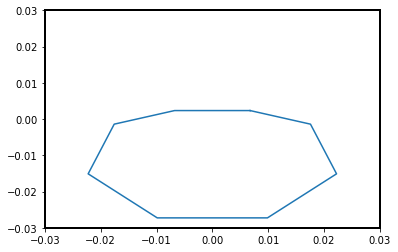

117


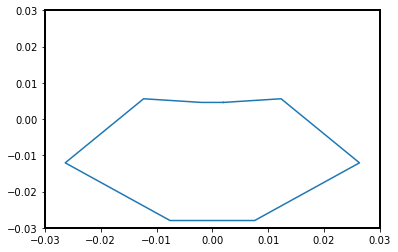

118


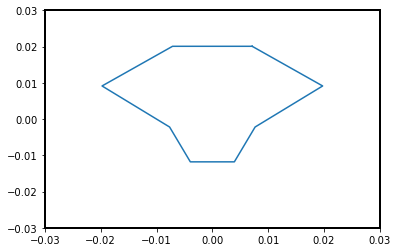

119


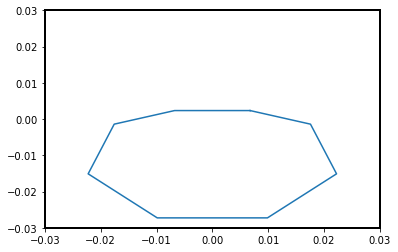

120


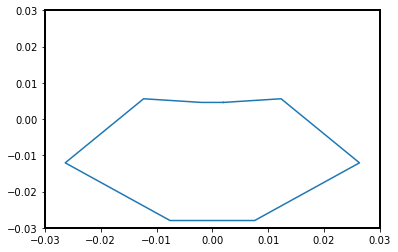

121


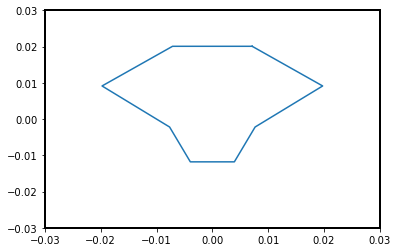

122


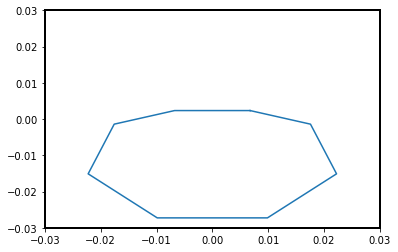

123


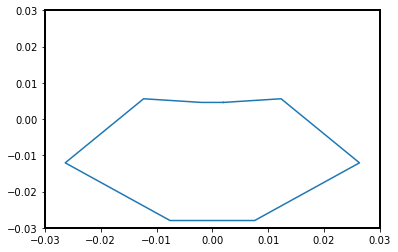

124


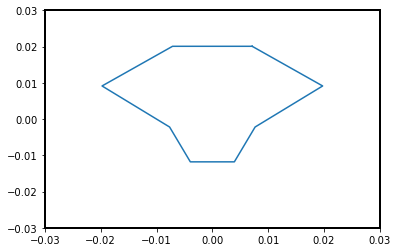

125


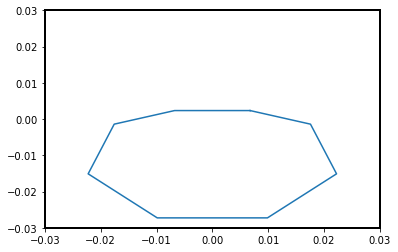

126


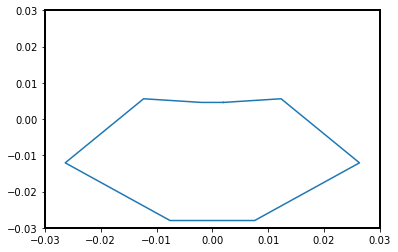

127


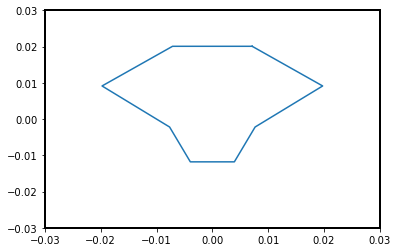

128


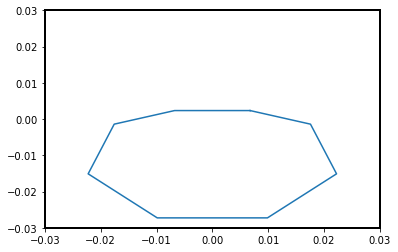

129


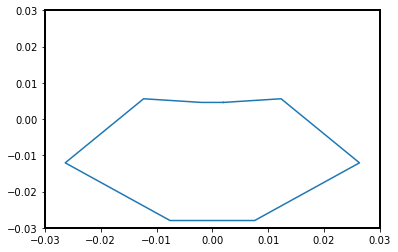

130


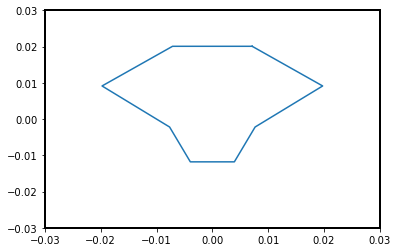

131


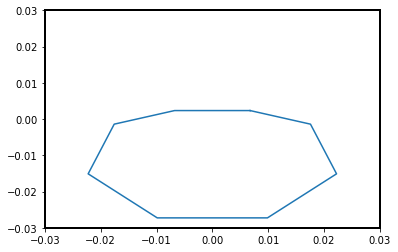

132


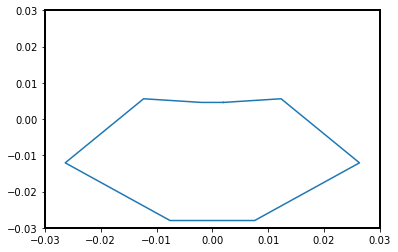

133


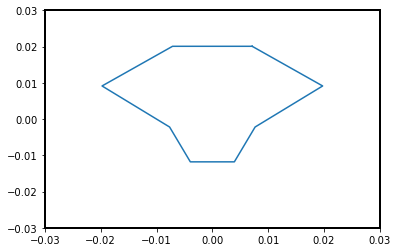

134


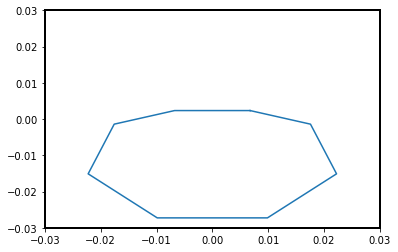

135


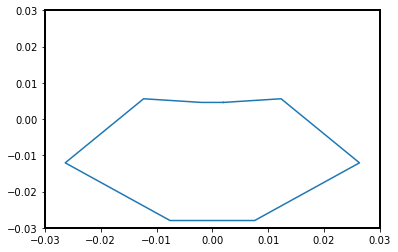

136


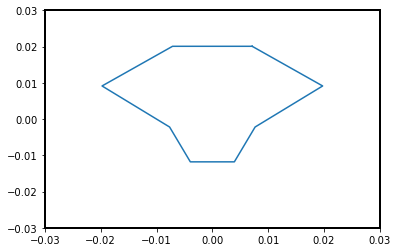

137


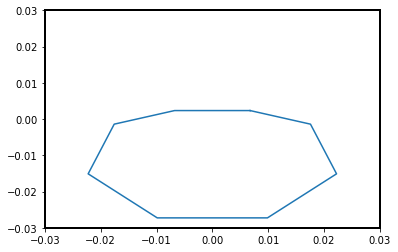

138


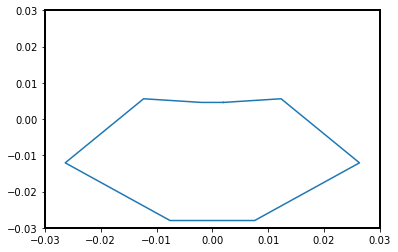

139


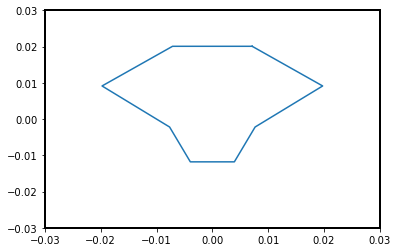

140


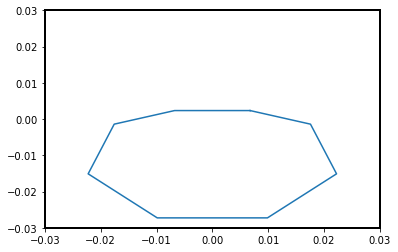

141


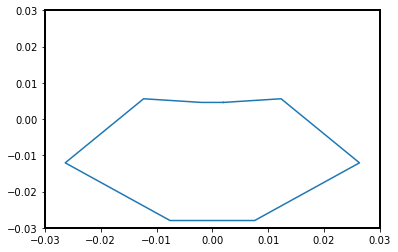

142


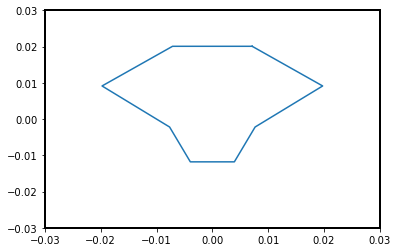

143


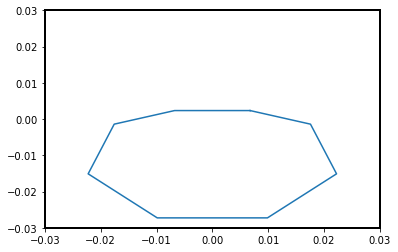

144


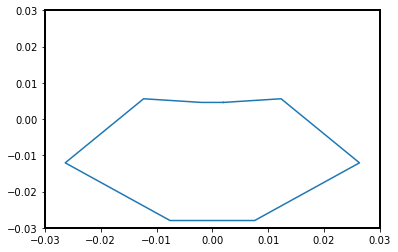

145


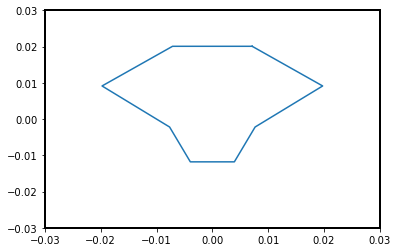

146


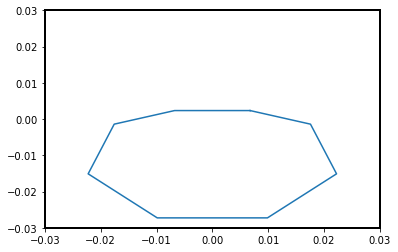

147


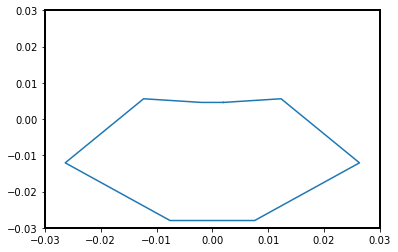

148


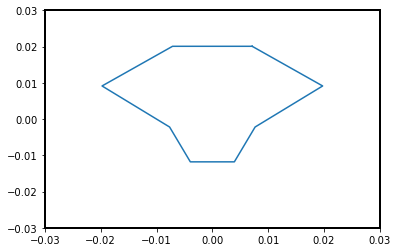

149


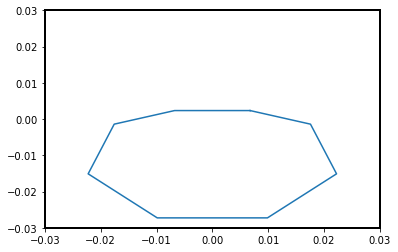

150


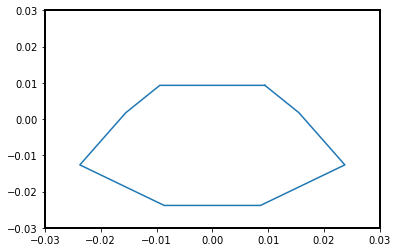

151


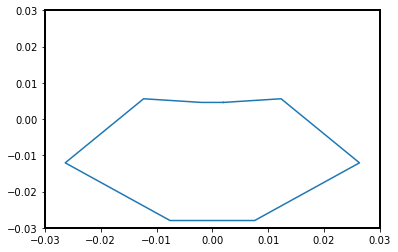

152


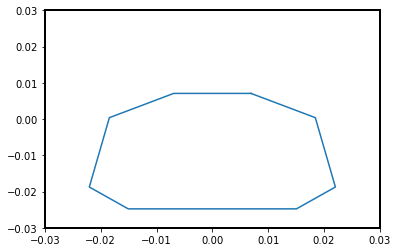

153


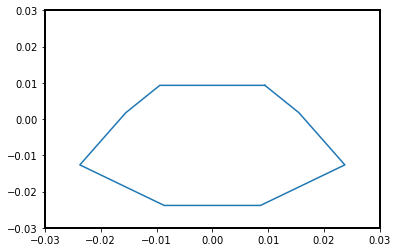

154


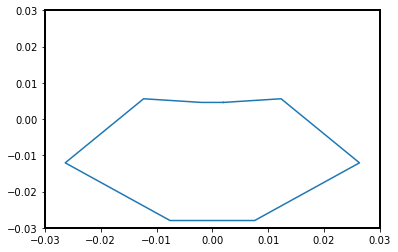

155


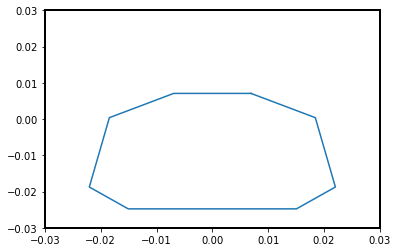

156


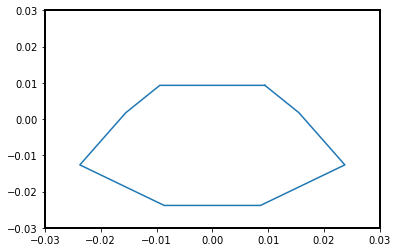

157


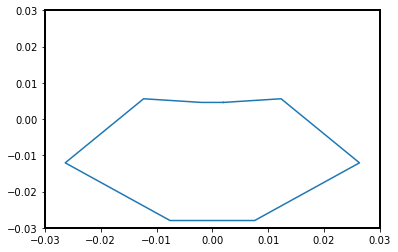

158


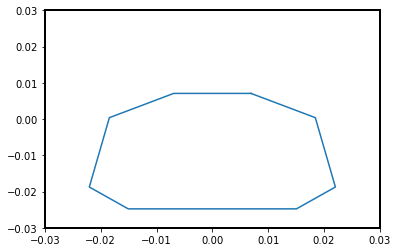

159


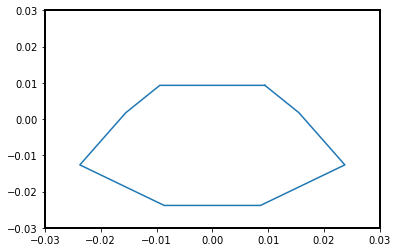

160


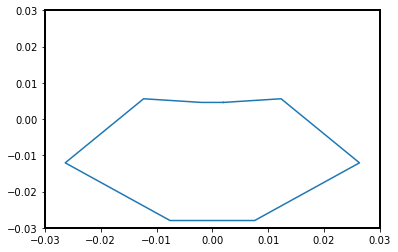

161


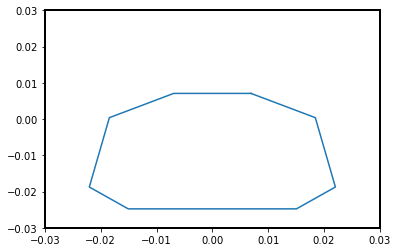

162


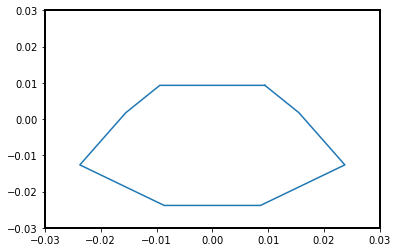

163


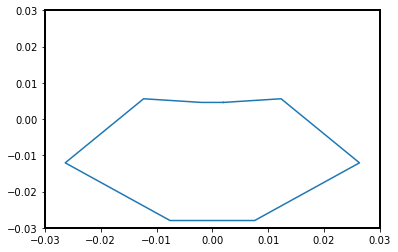

164


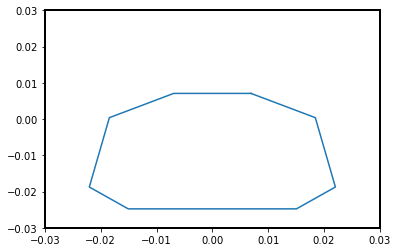

165


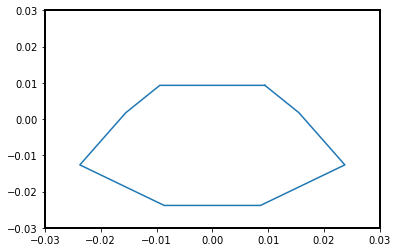

166


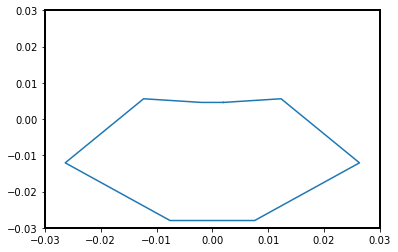

167


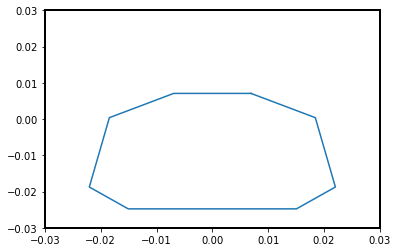

168


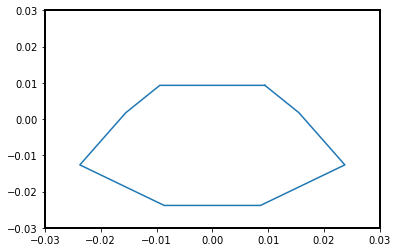

169


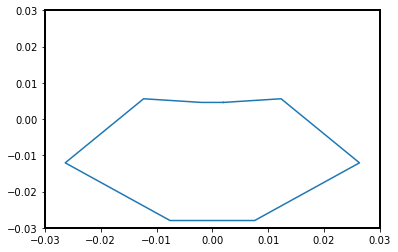

170


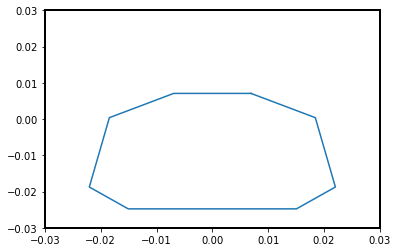

171


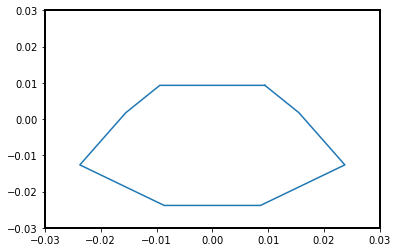

172


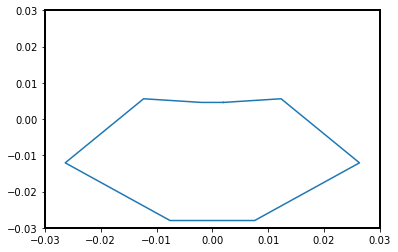

173


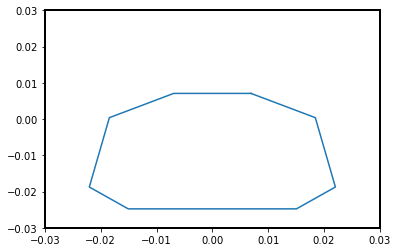

174


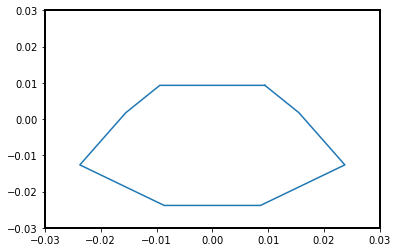

175


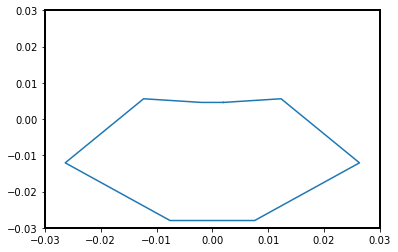

176


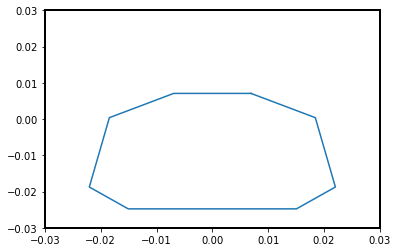

177


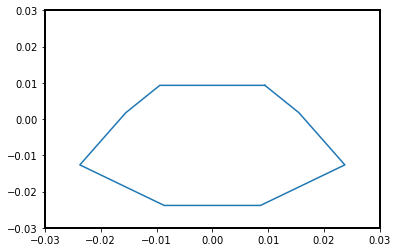

178


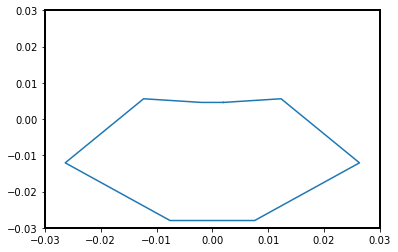

179


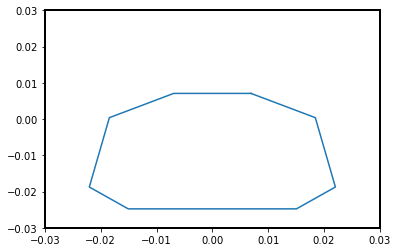

180


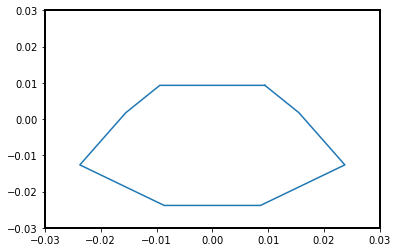

181


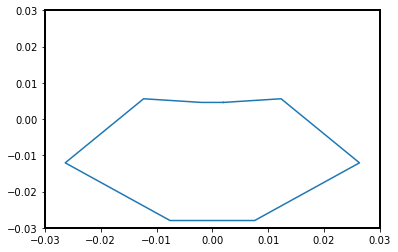

182


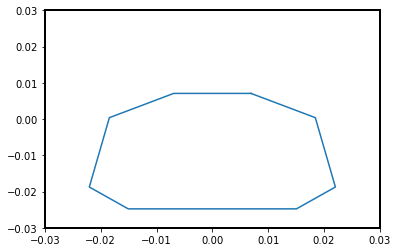

183


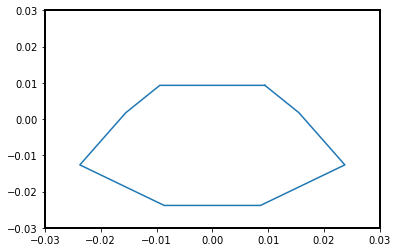

184


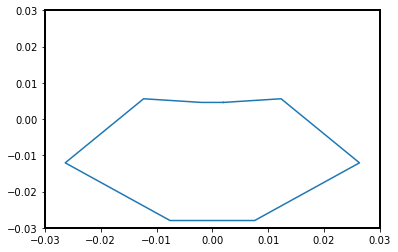

185


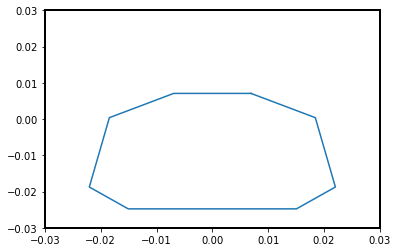

186


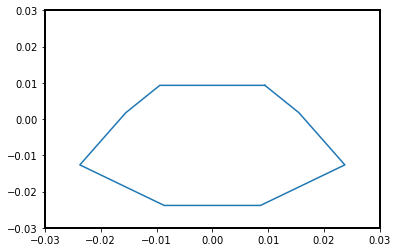

187


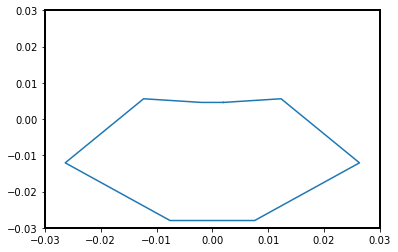

188


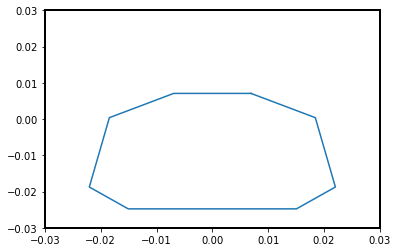

189


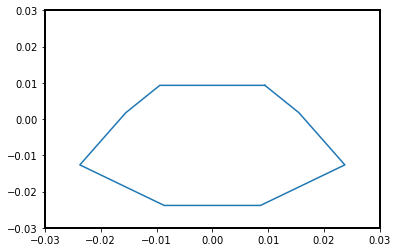

190


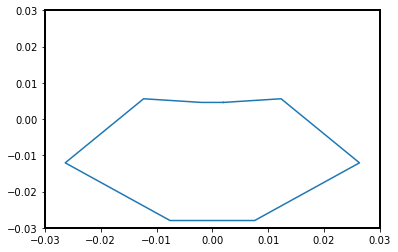

191


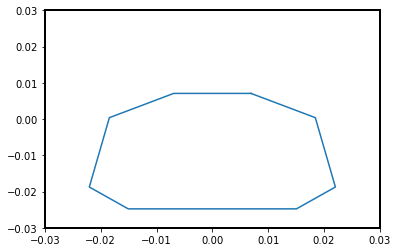

192


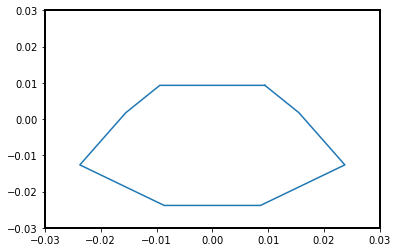

193


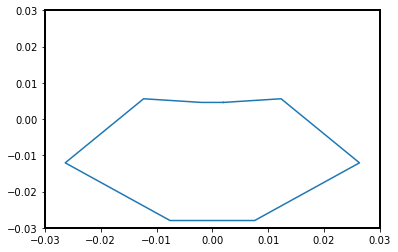

194


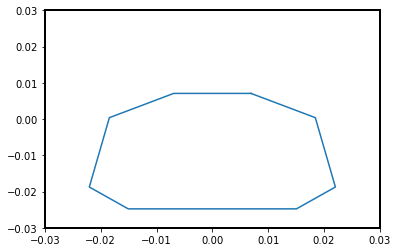

195


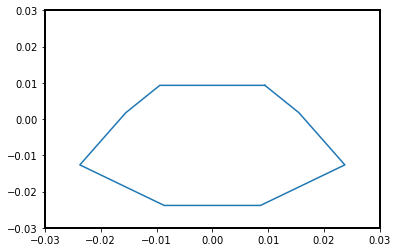

196


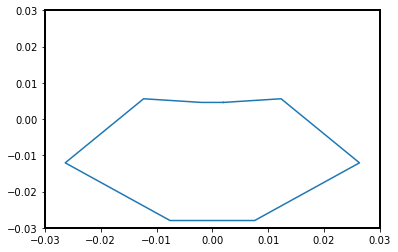

197


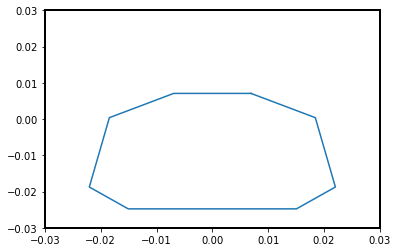

198


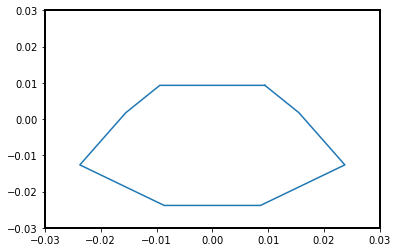

199


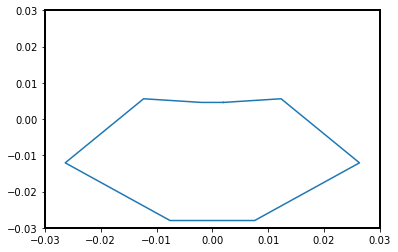

200


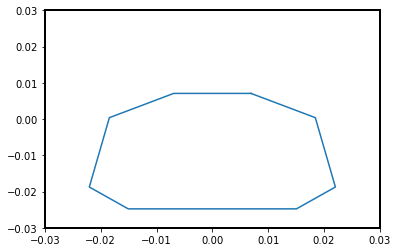

201


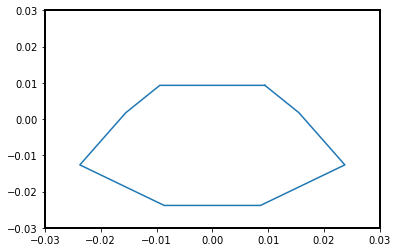

202


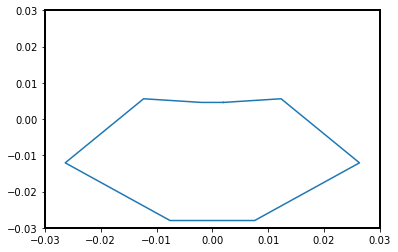

203


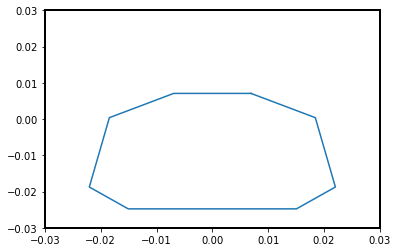

204


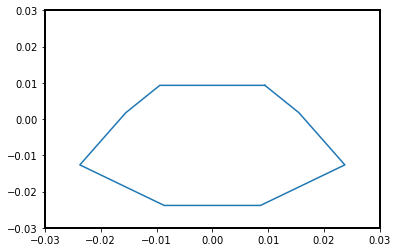

205


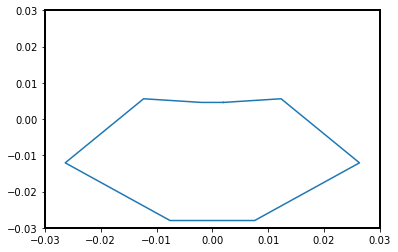

206


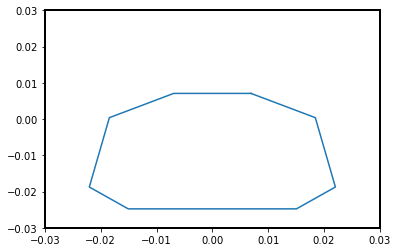

207


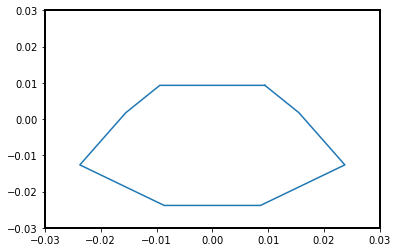

208


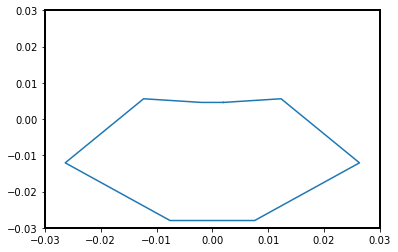

209


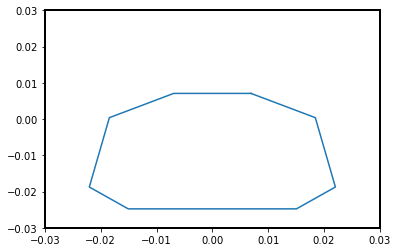

210


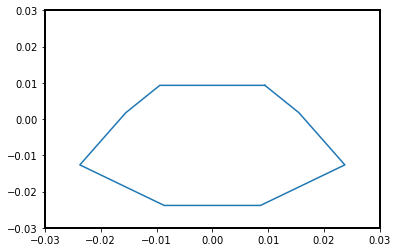

211


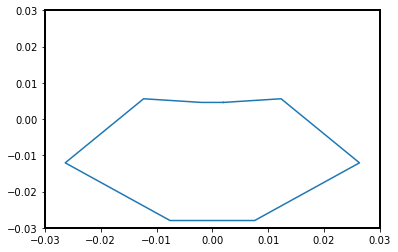

212


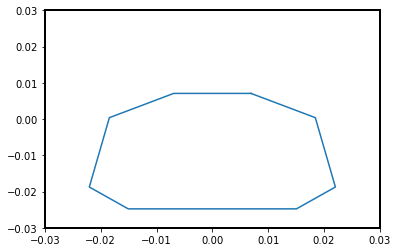

213


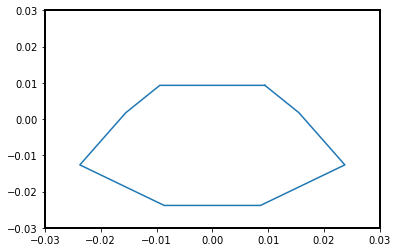

214


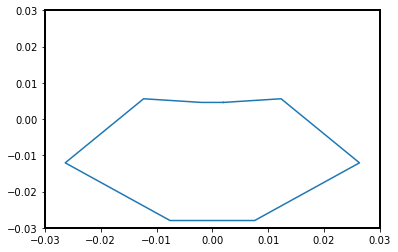

215


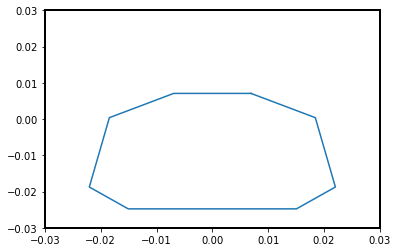

216


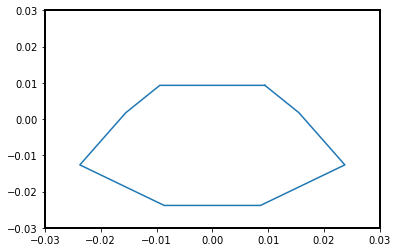

217


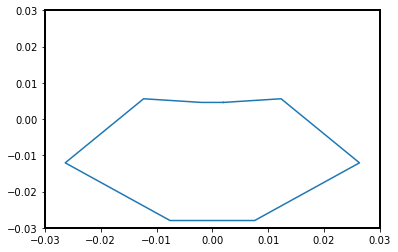

218


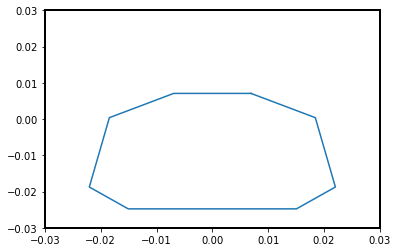

219


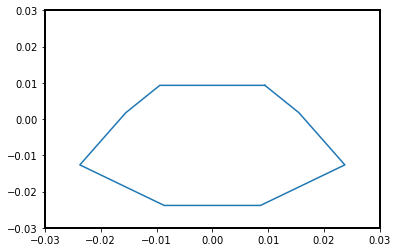

220


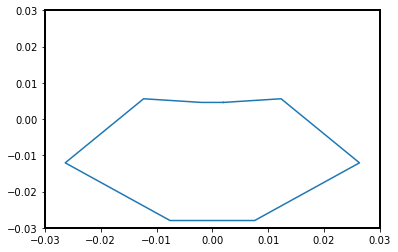

221


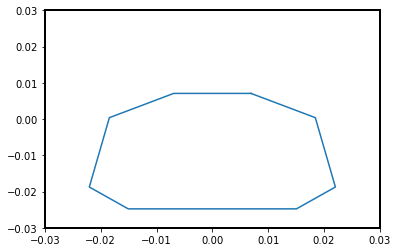

222


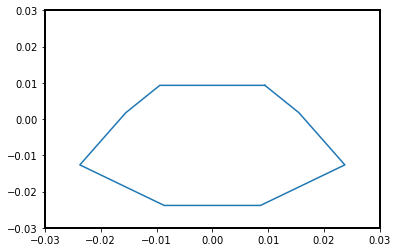

223


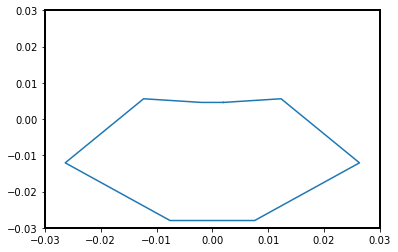

224


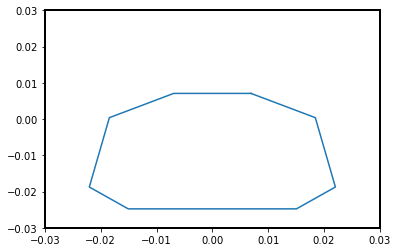

225


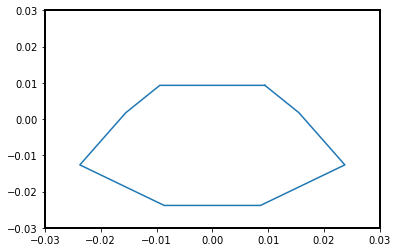

226


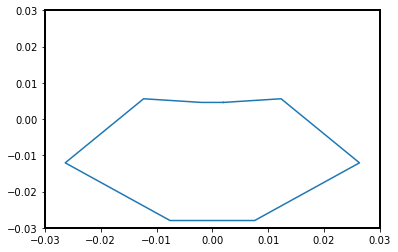

227


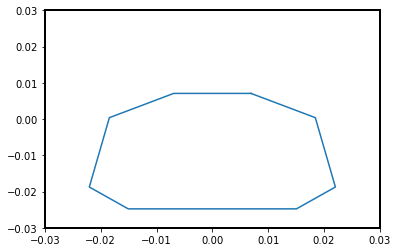

228


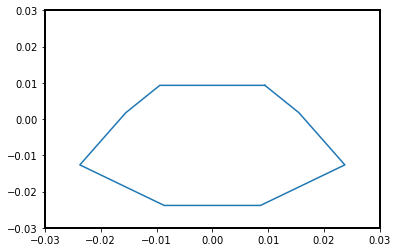

229


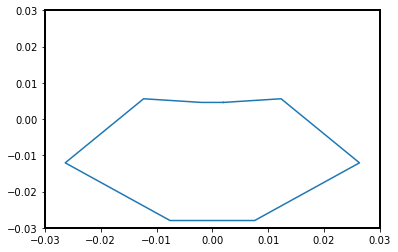

230


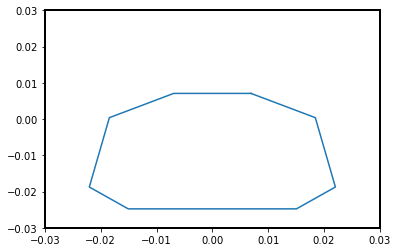

231


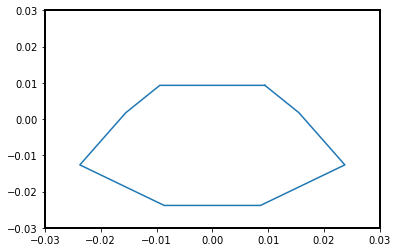

232


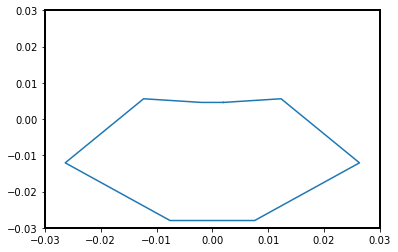

233


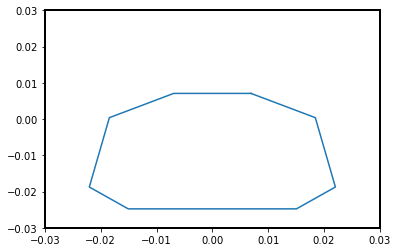

234


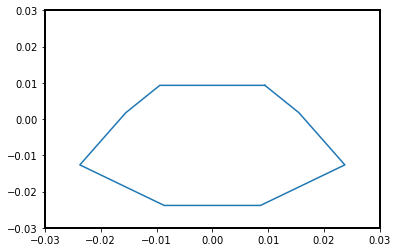

235


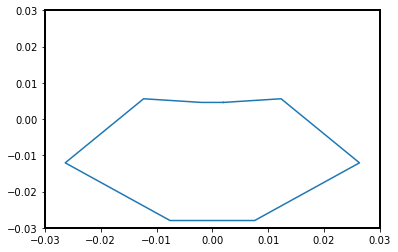

236


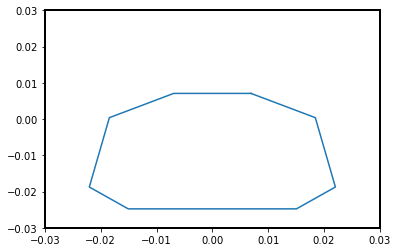

237


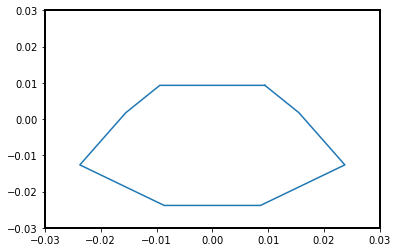

238


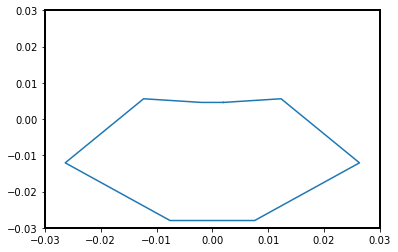

239


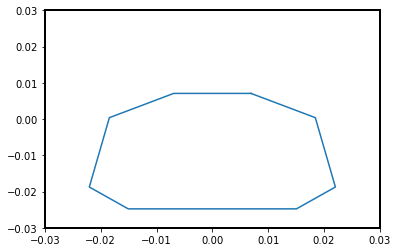

240


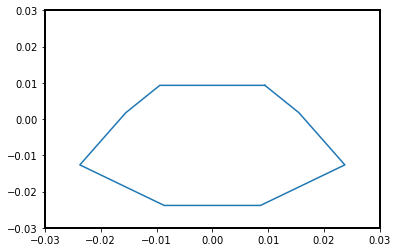

241


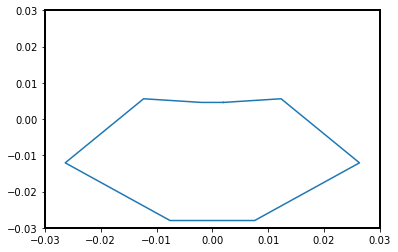

242


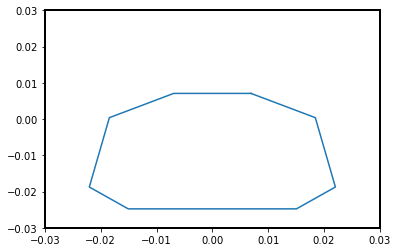

243


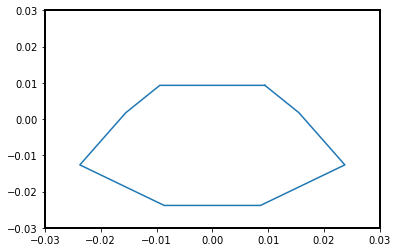

244


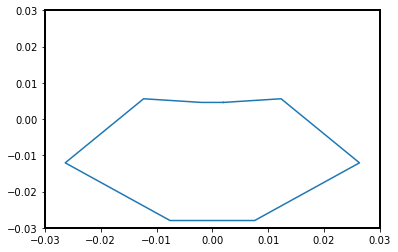

245


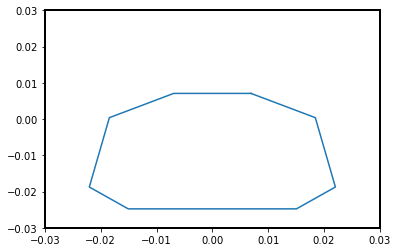

246


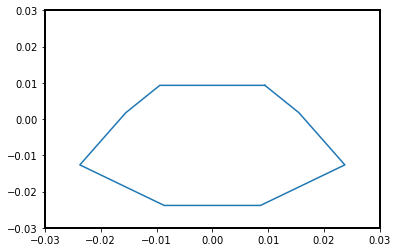

247


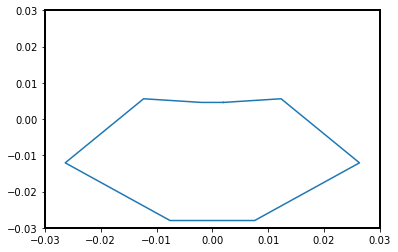

248


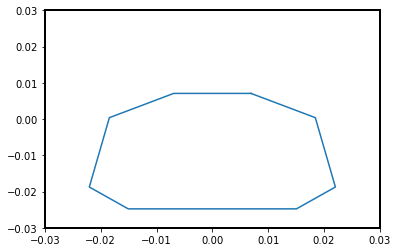

249


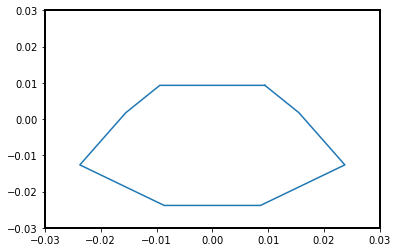

250


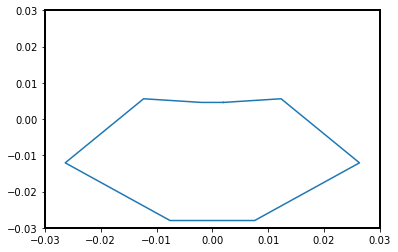

251


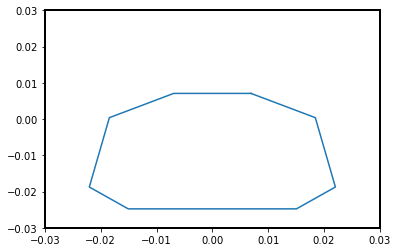

252


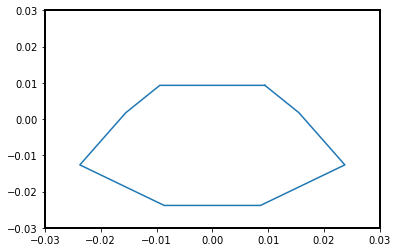

253


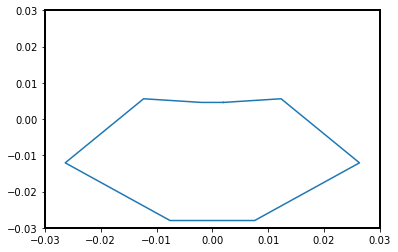

254


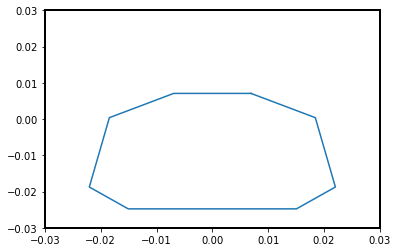

255


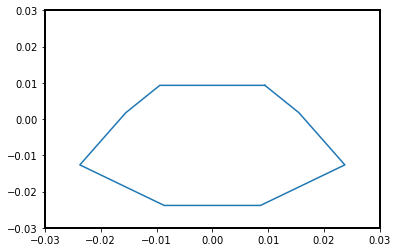

256


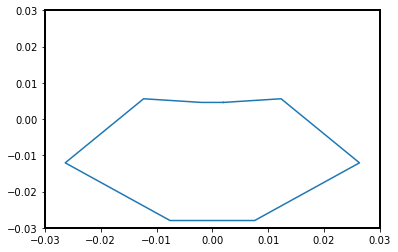

257


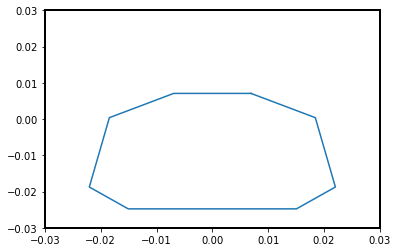

258


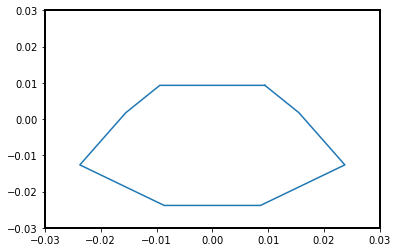

259


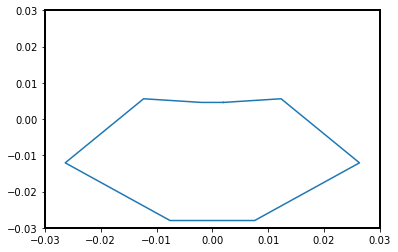

260


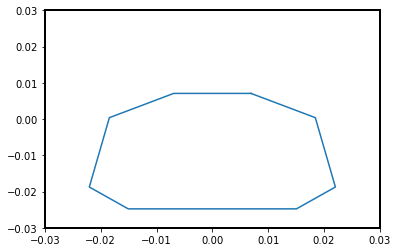

261


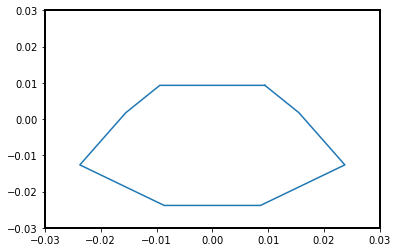

262


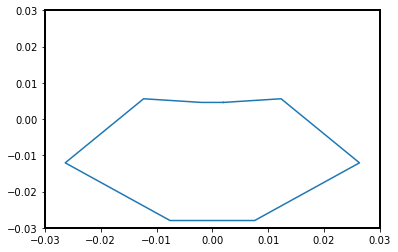

263


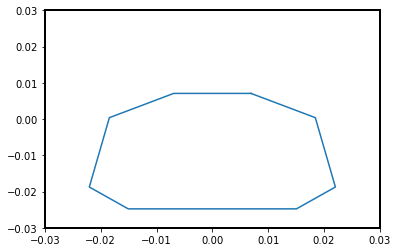

264


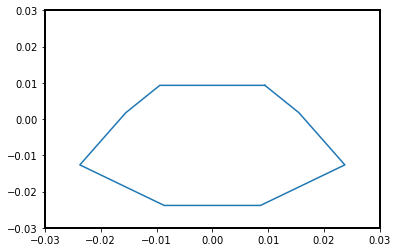

265


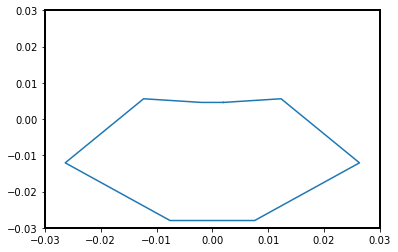

266


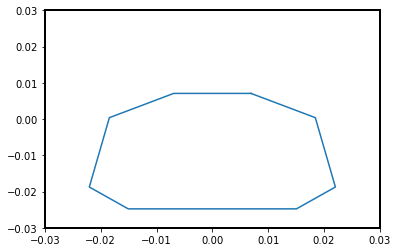

267


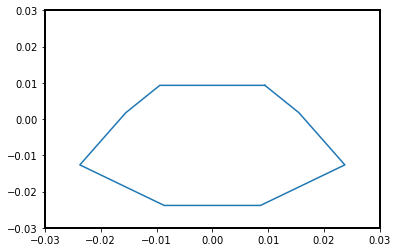

268


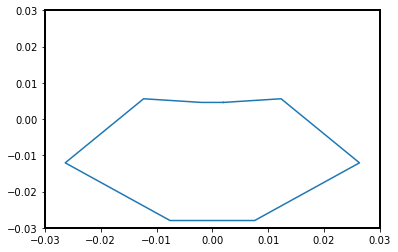

269


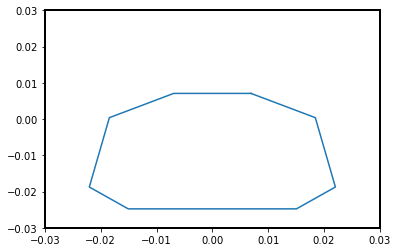

270


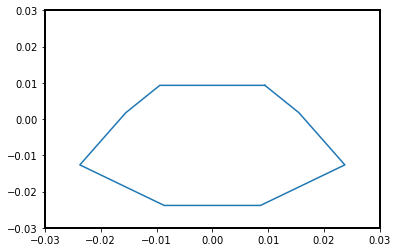

271


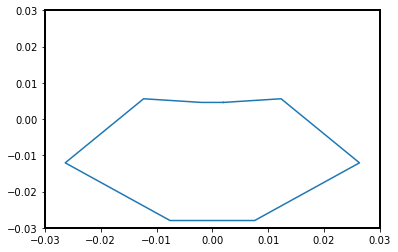

272


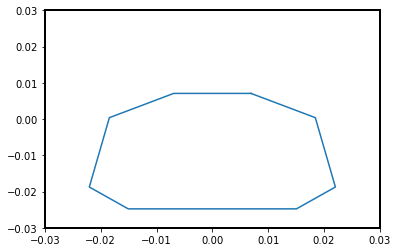

273


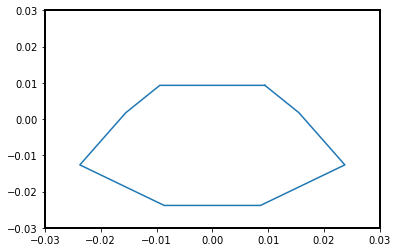

274


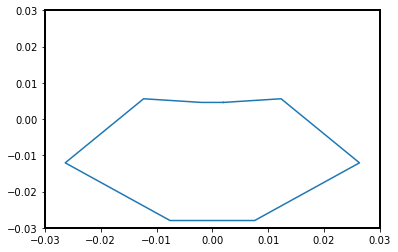

275


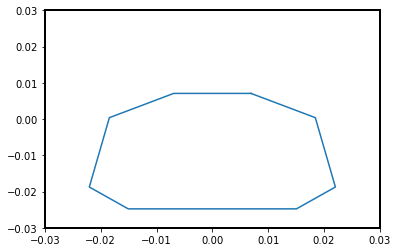

276


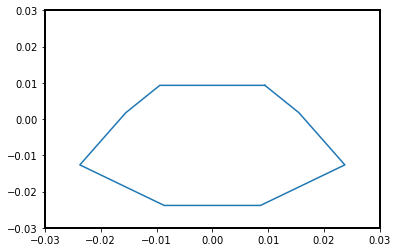

277


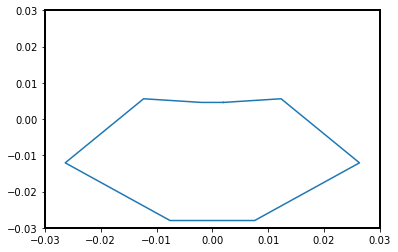

278


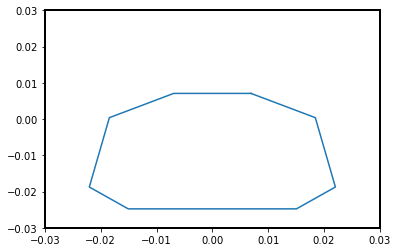

279


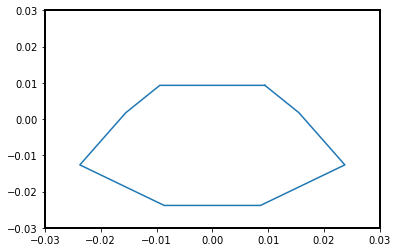

280


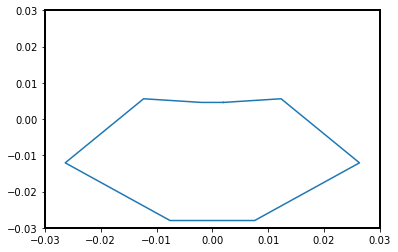

281


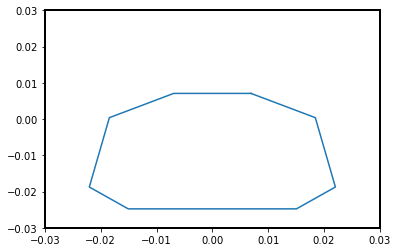

282


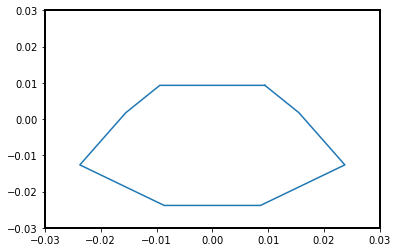

283


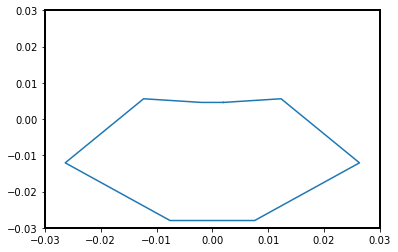

284


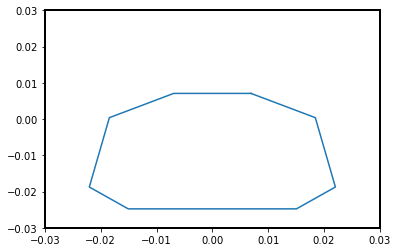

285


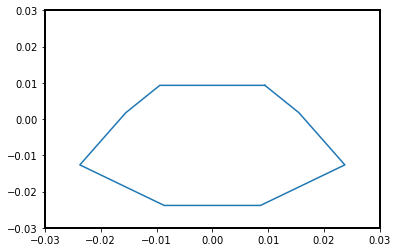

286


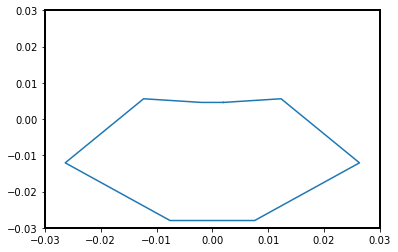

287


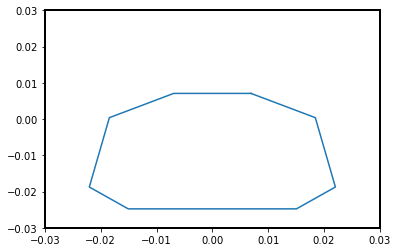

288


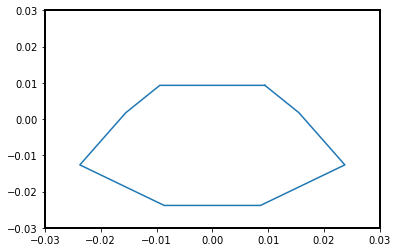

289


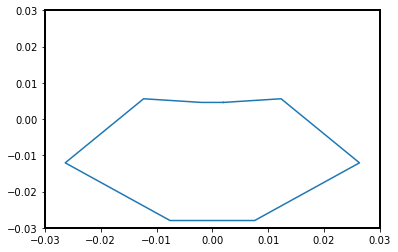

290


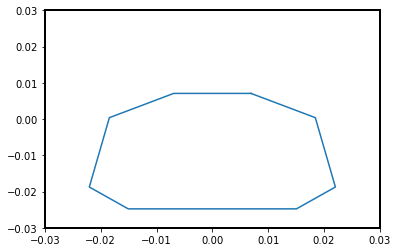

291


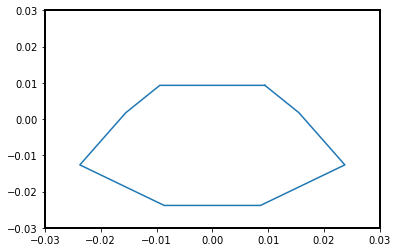

292


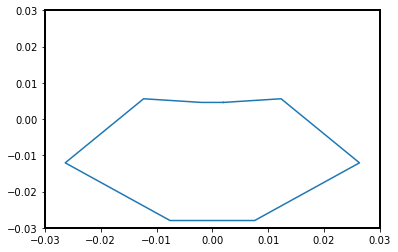

293


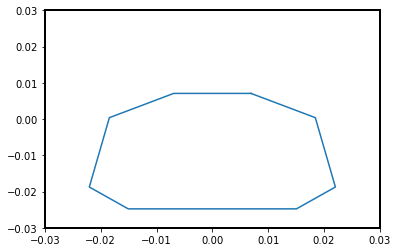

294


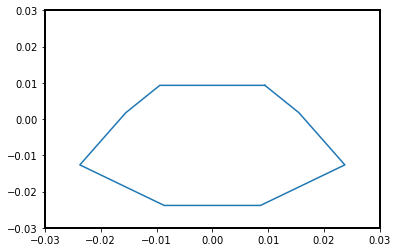

295


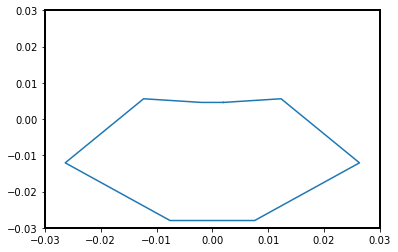

296


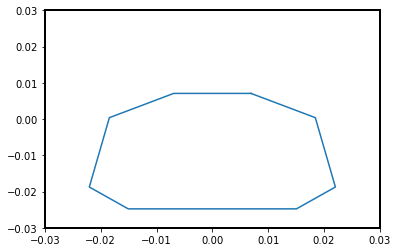

297


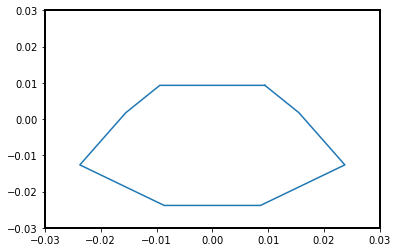

298


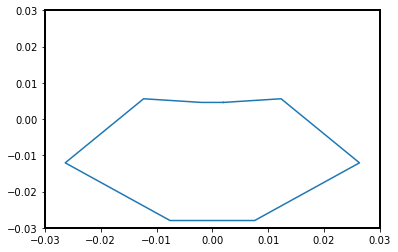

299


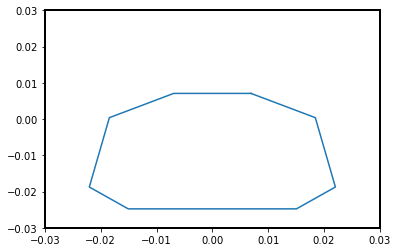

In [32]:
# import pred
xy=pred.polar_to_cartesian(best)
X = xy[:, 0:8]
Y = xy[:, 8:16]

for i in range(len(best)): 
  
    X_i = np.append(X[i, :], X[i, 0])
    Y_i = np.append(Y[i, :], Y[i, 0])

    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_linewidth(2)
    print(i)
    plt.plot(Y_i, X_i)
    plt.xlim(-0.03, 0.03)
    plt.ylim(-0.03, 0.03)
    plt.show()

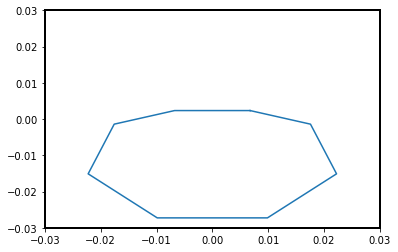

In [16]:
X=xy[:,0:8]
X = np.append(X[50,:],X[50,0])
Y = xy[:,8:16]
Y = np.append(Y[50,:],Y[50,0])
ax = plt.gca()
ax.spines['top'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
# print(X,Y)
plt.plot(Y,X)
plt.xlim(-0.03,0.03)
plt.ylim(-0.03,0.03)
plt.show()

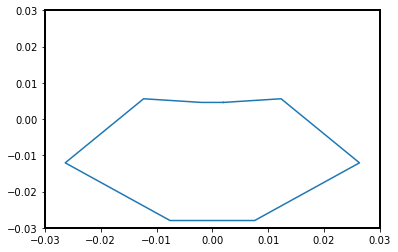

In [19]:
X=xy[:,0:8]
X = np.append(X[99,:],X[99,0])
Y = xy[:,8:16]
Y = np.append(Y[99,:],Y[99,0])
ax = plt.gca()
ax.spines['top'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
plt.plot(Y,X)
plt.xlim(-0.03,0.03)
plt.ylim(-0.03,0.03)
plt.show()

In [391]:
y=np.loadtxt('DNN_data_vs_pred.csv',delimiter=',')
y.shape

(6, 2)

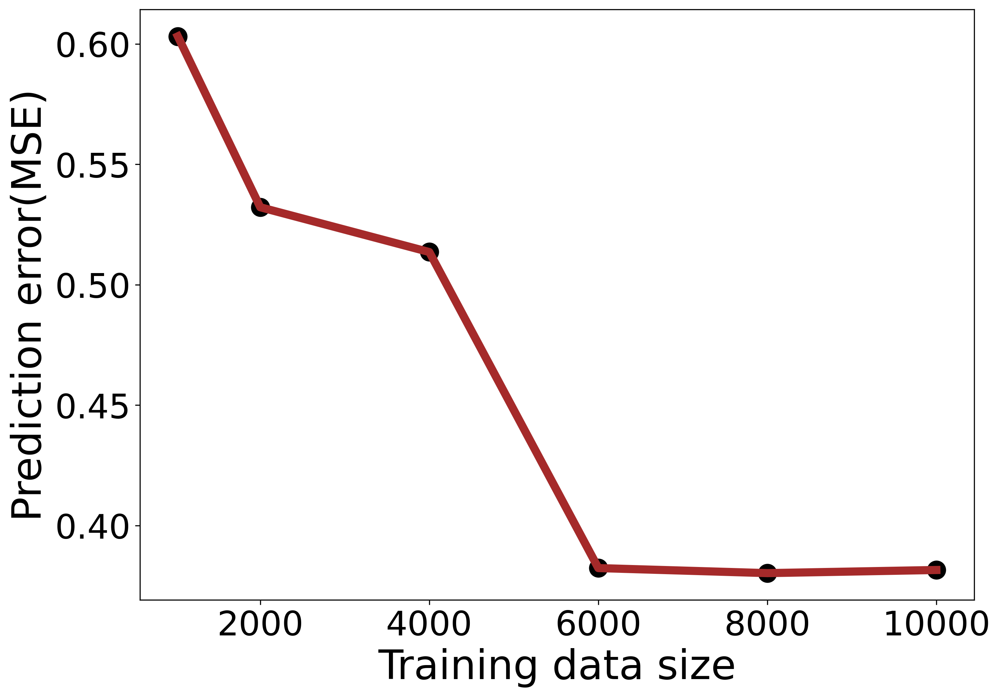

In [392]:
plt.figure(figsize = (11, 8),dpi=300)  
plt.plot(y[:,0],y[:,1],linewidth=6,color = 'brown')
plt.scatter(y[:,0],y[:,1],linewidth=8,color = 'black')
plt.xlabel('Training data size',fontsize=30)
plt.ylabel('Prediction error(MSE)',fontsize=30)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

In [661]:
def plot_box2():
    # Define data
    methods = ['surrogate-Isl-1', 'Matlab-Isl-1', 'surrogate-Isl-2', 'Matlab-Isl-2', 'surrogate-Isl-3', 'Matlab-Isl-3']
    values = [isl1, fitness[:,0], isl2, fitness[:,1], isl3, fitness[:,2]]

    # Create boxplot
    plt.figure(figsize=(12, 8))
    bp = plt.boxplot(values, patch_artist=True, vert=True)

#     Change the color of each box plot
    colors = ['deepskyblue', 'deepskyblue','brown', 'brown','green','green']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    # Thickening the mean line
    for median in bp['medians']:
        median.set_linewidth(2)

    # Add labels and title
    plt.ylabel('Fitness (MSE)', fontsize=20)
    plt.title('Comparison of surrogate and actual fitness', fontsize=30)
    plt.xticks([1, 2, 3, 4, 5, 6], methods, fontsize=15, rotation=45)
    plt.yscale('linear')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.ylim(0,1)
    plt.show()

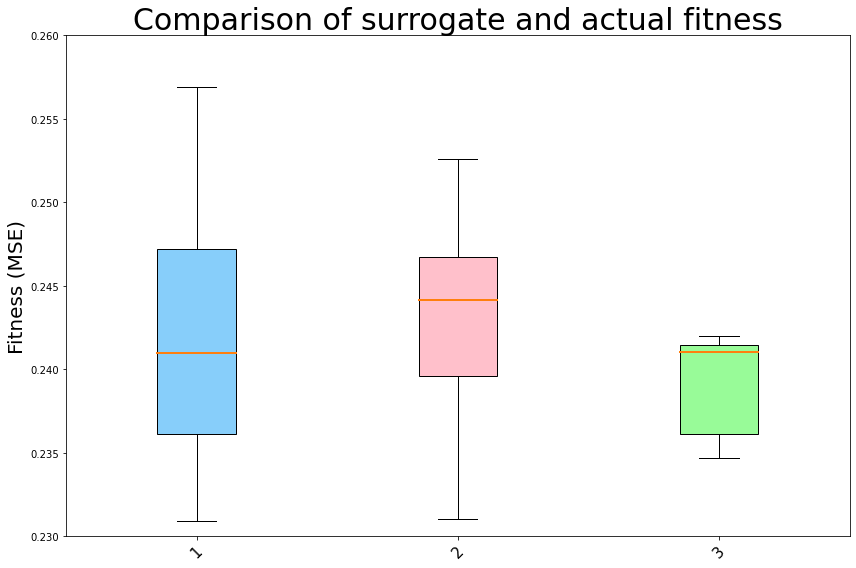

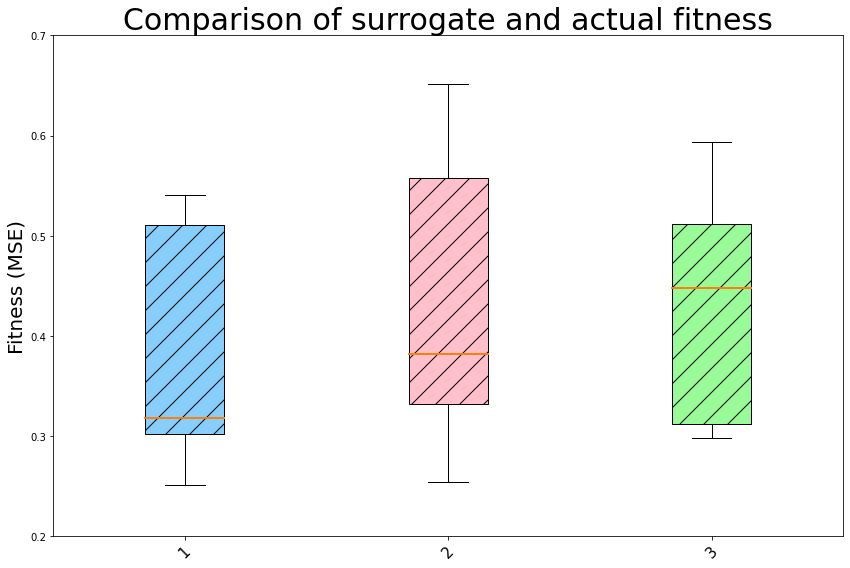

In [736]:
def plot_box3():
    # Define data
    methods = ['1','2','3']
    values = [isl1, isl2, isl3]

    # Create boxplot
    plt.figure(figsize=(12, 8))
    bp = plt.boxplot(values, patch_artist=True, vert=True)

#     Change the color of each box plot
    colors = ['lightskyblue', 'pink', 'palegreen']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    # Thickening the mean line
    for median in bp['medians']:
        median.set_linewidth(2)

    # Add labels and title
    plt.ylabel('Fitness (MSE)', fontsize=20)
    plt.title('Comparison of surrogate and actual fitness', fontsize=30)
    plt.xticks([1, 2, 3], methods, fontsize=15, rotation=45)
    plt.yscale('linear')
#     plt.grid(True, axis='y')
    plt.tight_layout()
    plt.ylim(0.23,0.26)
    plt.show()
    

def plot_box4():
    # Define data
    methods = ['1','2','3']
    values = [fitness[:,0], fitness[:,1], fitness[:,2]]

    # Create boxplot
    plt.figure(figsize=(12, 8))
    bp = plt.boxplot(values, patch_artist=True, vert=True)

#     Change the color of each box plot
    colors = ['lightskyblue', 'pink', 'palegreen']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_hatch('/')

    # Thickening the mean line
    for median in bp['medians']:
        median.set_linewidth(2)

    # Add labels and title
    plt.ylabel('Fitness (MSE)', fontsize=20)
    plt.title('Comparison of surrogate and actual fitness', fontsize=30)
    plt.xticks([1, 2, 3], methods, fontsize=15, rotation=45)
    plt.yscale('linear')
#     plt.grid(True, axis='y')
    plt.tight_layout()
    plt.ylim(0.2,0.7)
    plt.show()
    
plot_box3()
plot_box4()

In [719]:
fitness = np.loadtxt('matlab_fitn10run.txt')
isl1=[]
isl2=[]
isl3=[]


with open ("Data_bfits_10run.txt","r") as f:
    for line in f:
        p=line.split()
#         print(p[1])
        isl1.append(float(p[1][1:]))
        isl2.append(float(p[2][:]))
        isl3.append(float(p[3][:-1]))

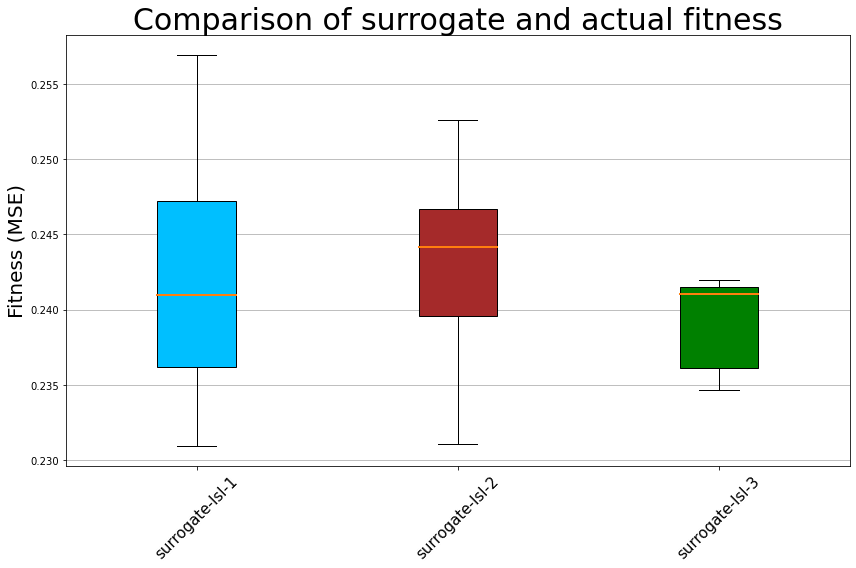

In [737]:
Pe1k = np.loadtxt('prediction_errors1k.txt')
Pe2k = np.loadtxt('prediction_errors2k.txt')
Pe4k = np.loadtxt('prediction_errors4k.txt')
Pe6k = np.loadtxt('prediction_errors6k.txt')
Pe8k = np.loadtxt('prediction_errors8k.txt')
Pe10k = np.loadtxt('prediction_errors10k.txt')

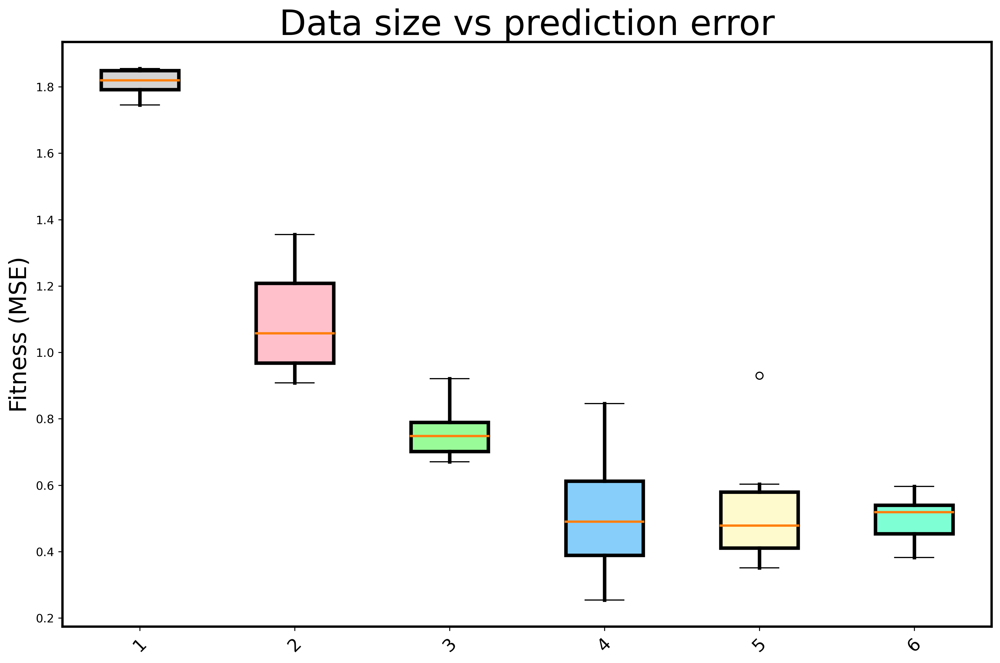

In [750]:
def plot_box_DNN():
    # Define data
    methods = ['Training data-1k', 'Training data-2k', 'Training data-4k', 'Training data-6k', 'Training data-8k', 'Training data-10k']
    values = [Pe1k, Pe2k, Pe4k, Pe6k, Pe8k,Pe10k]

    # Create boxplot
    plt.figure(figsize=(12, 8), dpi = 300)
    bp = plt.boxplot(values, patch_artist=True, vert=True)

#     Change the color of each box plot
    colors = ['lightgrey', 'pink', 'palegreen', 'lightskyblue', 'lemonchiffon', 'aquamarine']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    for box in bp['boxes']:
        box.set_linewidth(3)
    for whisker in bp['whiskers']:
        whisker.set_linewidth(3)
    # Thickening the mean line
    for median in bp['medians']:
        median.set_linewidth(2)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_linewidth(2)
    # Add labels and title
    plt.ylabel('Fitness (MSE)', fontsize=20)
    plt.title('Data size vs prediction error', fontsize=30)
    plt.xticks([1, 2, 3, 4, 5, 6],  fontsize=15, rotation=45)
    plt.yscale('linear')
#     plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()
    
plot_box_DNN()

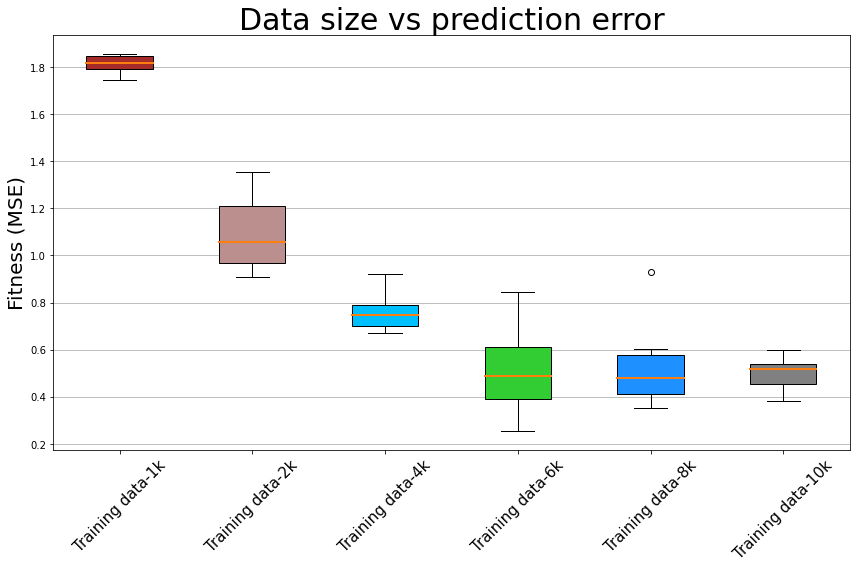

In [802]:
Pe1M = np.loadtxt('pred_errors1M.txt')
Pe5M = np.loadtxt('pred_errors5M.txt')
Pe8M =  np.loadtxt('pred_errors8M.txt')
Pe11M = np.loadtxt('pred_errors11M.txt')
Pe15M = np.loadtxt('pred_errors15M.txt')
Pe20M = np.loadtxt('pred_errors21M.txt')

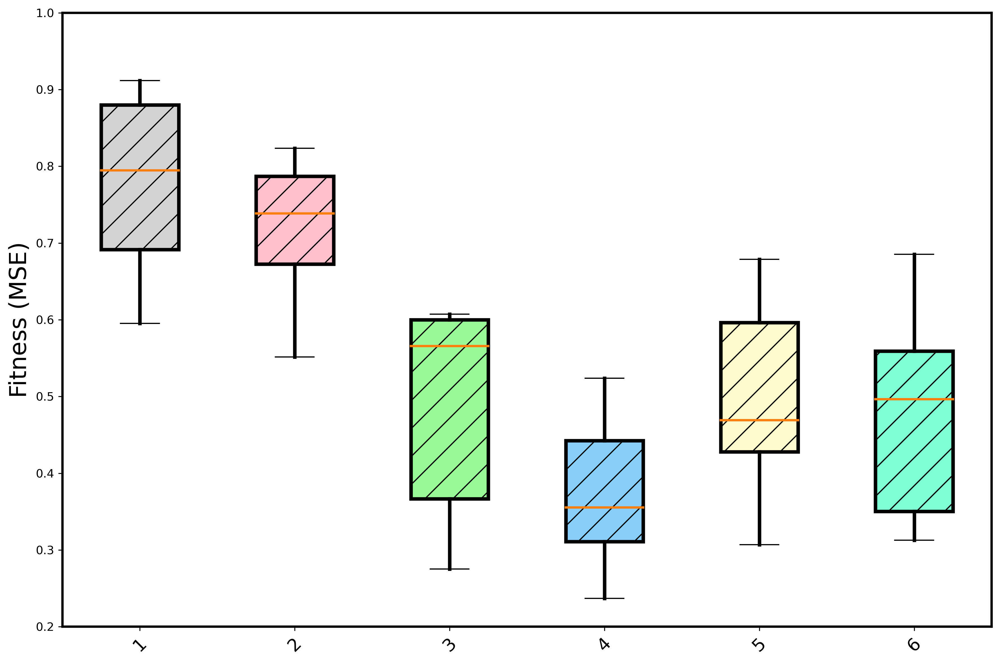

In [810]:
def plot_box_Tr():
    # Define data
    methods = ['Trainable Params-1 million', 'Trainable Params-5 million','Trainable Params-8 million', 'Trainable Params-11 million','Trainable Params-15 million','Trainable Params-20 million']
    values = [Pe1M, Pe5M, Pe8M, Pe11M, Pe15M, Pe20M]

    # Create boxplot
    plt.figure(figsize=(12, 8), dpi = 300)
    bp = plt.boxplot(values, patch_artist=True, vert=True)

#    Change the color of each box plot
    colors = ['lightgrey', 'pink', 'palegreen', 'lightskyblue', 'lemonchiffon', 'aquamarine']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_hatch('/')
    for box in bp['boxes']:
        box.set_linewidth(3)
    for whisker in bp['whiskers']:
        whisker.set_linewidth(3)
    # Thickening the mean line
    for median in bp['medians']:
        median.set_linewidth(2)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_linewidth(2)
    # Add labels and title
    plt.ylabel('Fitness (MSE)', fontsize=20)
#     plt.title('Trainable parameters vs prediction error', fontsize=30)
    plt.xticks([1, 2, 3, 4, 5,6], fontsize=15, rotation=45)
    plt.yscale('linear')
    plt.ylim(0.2,1)
#     plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()
plot_box_Tr()

In [555]:
pat_tar = np.loadtxt('ant128patt_rect.txt',delimiter=',')
pat=np.reshape(pat_tar,(13,25,128))
bbb=np.swapaxes(pat,0,2)
tar = bbb[52,:,:]

In [574]:
tar.shape
aa = tar[6]
bb = np.flip(aa)
cc = np.append(bb,aa)

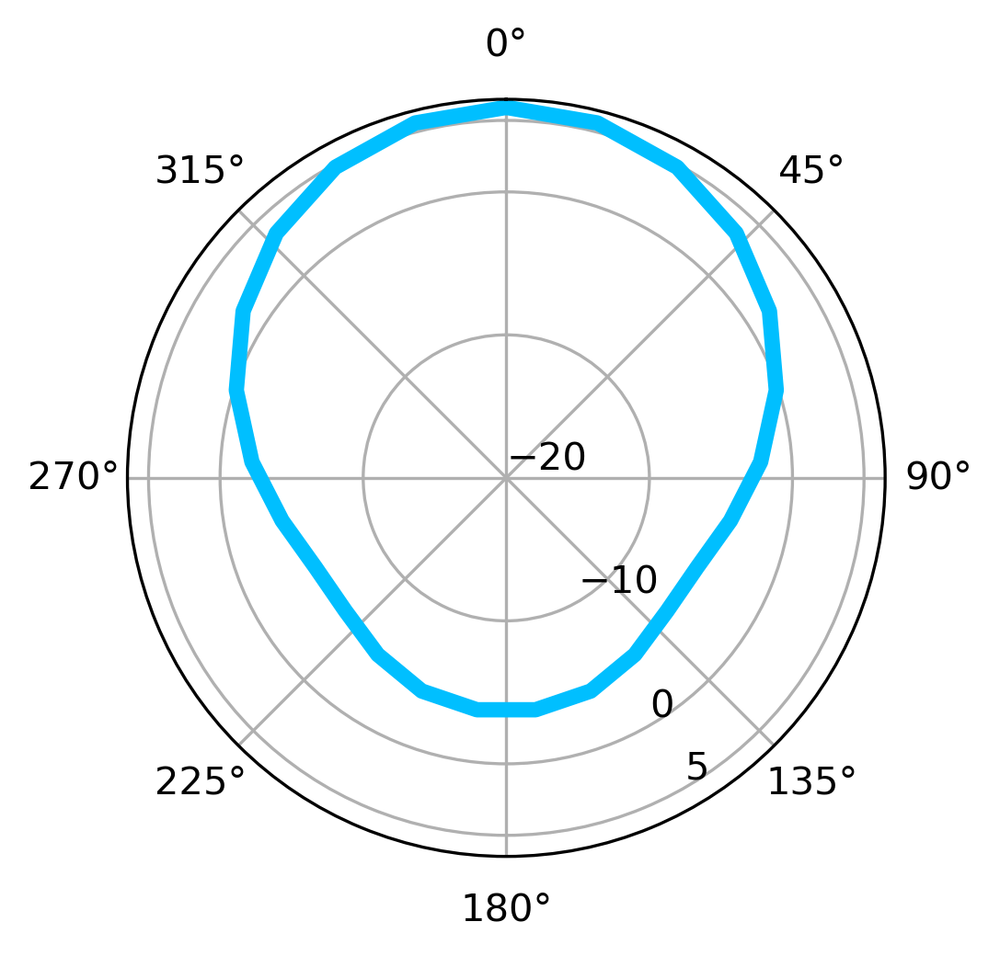

In [575]:
phi1 = np.linspace(0, 2*np.pi, 25)
phi2 = np.linspace(0, 2*np.pi,26)
plt.figure(figsize = (11, 8),dpi=300)
sp1 = plt.subplot(2, 1, 1, projection='polar')
sp1.set_theta_zero_location('N')
sp1.set_theta_direction(-1)
# sp1.set_xticklabels([])
# plt.polar(phi1, tar[:,12],label='EM simulated',linewidth=4,color = 'dodgerblue' )
plt.polar(phi2, cc,linewidth=4,label='EM simulated',color = 'deepskyblue')

ax = plt.gca()
ax.set_rticks([-20, -10, 0, 5])
# ax.set_yticklabels([])
ax.set_rlabel_position(150)
plt.show()


In [866]:
pred = np.loadtxt('antII-2.2G_pred_patt.txt')
pred.shape

(722, 2)

In [867]:
np.savetxt('pred4_rad_patt.csv',pred[:,1])